### It is possible that a candidate is associated with the same polygon twice, must be fixed CARS 0042 A21

### Problem with the incomplete bboxes is fixed, both in gt and test

## A4 stays out

## A9 is not working for 08 and 09, but should stay in

## A10 reveals a problem with the candidate selection, must be changed

THE GT AND OTHER MASKS ARE SMALLER BECAUSE THEY ARE GETTING CUT DURING THE DETERMINATION OF THE ROTATED BBOX
a10, la seleccion del candidato no es buena, hay q mejorar, c14

a9 problems with the gt, error 08 09, just select other images

A8 has problems in one of the gt, we need to consider the proportion of votes and not just the number. it starts good then gets messed up TRY AGAIN ITS IMPORTANT

#A7 is ok but one of gt is bad

A5 A6 inst_09 and 10 are wrong in the gt


# Evaluation of the previously trained algorithm for Medical Instrument Identification

This notebook consists on an adaptation of the code provided by Waleed Abdulla avalable in the following link https://github.com/matterport/Mask_RCNN. The goal of this adaptation evaluate the previously trained algorithm for the instance segmentation of the medical instruments. Hereby, the confusion matrix and the Intersection over Union (IoU) are calculated for both the validation and test datasets.

Author of this adaptation: Jorge Badilla Solórzano

# Import

In [13]:
import os
import cv2
from itertools import combinations
# from sympy import Polygon, Point
from shapely.geometry import Polygon, mapping
import sys
import itertools
import math
import logging
import json
import re
import random
import datetime
import skimage.draw
from skspatial.objects import Plane, Line, Points
from skspatial.plotting import plot_3d
from collections import OrderedDict
from configuration import Config
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
# from matplotlib.patches import mat_Polygon

# Root directory of the project
ROOT_DIR = os.path.abspath("../CARS 2023/") #"../../"

# Import Mask RCNN
#sys.path.append(ROOT_DIR)  # To find local version of the library
print(ROOT_DIR)
from MRCNN import utils
import MRCNN.model as modellib
from MRCNN import visualize
from MRCNN.visualize import display_images

from MRCNN.model import log
#import instruments

#import instruments #from samples import Instruments

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
#Download COCO trained weights from Releases if needed
#if not os.path.exists(COCO_MODEL_PATH):
#    utils.download_trained_weights(COCO_MODEL_PATH)



%matplotlib inline 

C:\Users\joreb\Desktop\CARS 2023


# Configuration

Here the hyperparameters for the training are defined.

In [14]:
class InstrumentsConfig(Config):

    # Give the configuration a recognizable name
    NAME = "instruments"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 5

    # Number of classes (including background)
    NUM_CLASSES = 1 + 18 # background + 3 shapes                         CAMBIAR 6 por 18
    NUM_INST = 1 + 18 #Number of instruments + 1
    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512

    # Use smaller anchors because our image and objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    TRAIN_ROIS_PER_IMAGE = 32 #Originally 32

    # Use a small epoch since the data is simple
    STEPS_PER_EPOCH = 635 #3172 #635 #3172 #135

    # use small validation steps since the epoch is small
    VALIDATION_STEPS = 100
    
    DETECTION_MIN_CONFIDENCE = 0.0
    
config = InstrumentsConfig()
config.display()


# Instruments_DIR = os.path.join(ROOT_DIR, "Images/val") #CHANGE BALLOON_DIR by Instruments_DIR


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     5
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        18
DETECTION_MIN_CONFIDENCE       0.0
DETECTION_NMS_THRESHOLD        0.1
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 5
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                31
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

# General Configuration for the Datasets

In [15]:
class InstrumentsDataset(utils.Dataset):

    def load_instruments(self, dataset_dir):
        global a

        """Load a subset of the Instruments dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
		
        # Add classes
        self.add_class("instruments", 1, "C00")
        self.add_class("instruments", 2, "C01")
        self.add_class("instruments", 3, "C02")
        self.add_class("instruments", 4, "C03")
        self.add_class("instruments", 5, "C04")
        self.add_class("instruments", 6, "C05")
        self.add_class("instruments", 7, "C06")
        self.add_class("instruments", 8, "C07")
        self.add_class("instruments", 9, "C08")
        self.add_class("instruments", 10, "C09")
        self.add_class("instruments", 11, "C10")
        self.add_class("instruments", 12, "C11")
        self.add_class("instruments", 13, "C12")
        self.add_class("instruments", 14, "C13")
        self.add_class("instruments", 15, "C14")
        self.add_class("instruments", 16, "C15")
        self.add_class("instruments", 17, "C16")
        self.add_class("instruments", 18, "C17")  




        file_list = os.listdir(dataset_dir)
        

        try:
            file_list.remove('masks')
        except:
            l = 0
        try:
            file_list.remove('via_region_data.json')
        except:
            l = 0
        try:
            file_list.remove('Thumbs.db')
        except:
            l = 0
        
        for file in file_list:

            image_path = os.path.join(dataset_dir, file)     
            mask_path = os.path.join(Mask_DIR, file)
            image = skimage.io.imread(image_path)
    
            mask = skimage.io.imread(mask_path)
            height, width = image.shape[:2]
            
            label = []
            
            for i in range(config.NUM_INST):                 
                if np.max(np.max(mask == i)):
                    if i != 0:
                        if i == 1:
                            d = {"name":"inst_00"}
                        elif i == 2:
                            d = {"name":"inst_01"}
                        elif i == 3:
                            d = {"name":"inst_02"}
                        elif i == 4:
                            d = {"name":"inst_03"}
                        elif i == 5:
                            d = {"name":"inst_04"}
                        elif i == 6:
                            d = {"name":"inst_05"}
                        elif i == 7:
                            d = {"name":"inst_06"}
                        elif i == 8:
                            d = {"name":"inst_07"}                        
                        elif i == 9:
                            d = {"name":"inst_08"}
                        elif i == 10:
                            d = {"name":"inst_09"}
                        elif i == 11:
                            d = {"name":"inst_10"}
                        elif i == 12:
                            d = {"name":"inst_11"}
                        elif i == 13:
                            d = {"name":"inst_12"}
                        elif i == 14:
                            d = {"name":"inst_13"}
                        elif i == 15:
                            d = {"name":"inst_14"}     
                        elif i == 16:
                            d = {"name":"inst_15"}
                        elif i == 17:
                            d = {"name":"inst_16"}
                        elif i == 18:
                            d = {"name":"inst_17"}  
                        label.append(d)


            self.add_image(
                "instruments",   
                image_id=file,  
                path=image_path,
                width=width, height=height,
                polygons=[], label=label)

    def load_mask(self, image_id):             
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]

        path = self.image_info[image_id]['path']

        mask_list = os.listdir(Mask_DIR)
        file = mask_list[image_id]
        mask_path = os.path.join(Mask_DIR, file)
        
        mask0 = skimage.io.imread(mask_path)
        ch = 0
        ind = []
        ar = []

        for i in range(config.NUM_INST):

            if np.max(np.max(mask0 == i)):
                #print('holis')
                if i != 0:
                    ch += 1
                    ind.append(i)
                    ar.append(i)

        mask = np.zeros((np.shape(mask0)[0], np.shape(mask0)[1], ch))

        for c in range(ch):
            mask[:,:,c] = mask0 == ind[c]

        mask = mask.astype(bool)
        ar = np.asarray(ar)

        return mask, ar #[1, 1, 1, 1]ar.astype(int)

        # Pack instance masks into an array
        if class_ids:
            mask = np.stack(instance_masks, axis=2).astype(bool)
            class_ids = np.array(class_ids, dtype=np.int32)
            return mask, class_ids
        else:
            # Call super class to return an empty mask
            return super(InstrumentsDataset, self).load_mask(image_id)

## Methods

In [16]:
def rot_x(angle):
    Rx = np.array([[1, 0, 0], [0, np.cos(angle), -np.sin(angle)], [0, np.sin(angle), np.cos(angle)]])
    return Rx

def rot_y(angle):
    Ry = np.array([[np.cos(angle), 0, np.sin(angle)], [0, 1, 0], [-np.sin(angle), 0, np.cos(angle)]])
    return Ry

def rot_z(angle):
    Rz = np.array([[np.cos(angle), -np.sin(angle), 0], [np.sin(angle), np.cos(angle), 0], [0, 0, 1]])
    return Rz

def Rzyx(A, B, C):
    Rzyx = np.matmul(rot_z(A), np.matmul(rot_y(B), rot_x(C)))
    return Rzyx

def T_from_pose(pose):
    X = pose[0]/1000
    Y = pose[1]/1000
    Z = pose[2]/1000
    A = pose[3]
    B = pose[4]
    C = pose[5]
    Rot = Rzyx(A, B, C)
    v = np.reshape(np.array([0, 0, 0, 1]), (1, 4))
    t = np.reshape(np.array([X, Y, Z]), (3, 1))
    T_0 = np.concatenate((Rot, t), axis = 1)
    T = np.concatenate((T_0, v), axis = 0)
    return T

def camera_to_base(point, T):
    p_list = point.tolist() ###############
    point_n = np.asarray(p_list) ##############
    point = np.reshape(point_n, [3,1])
    one = np.reshape(np.array([1]), [1,1])
    point_h = np.concatenate((point, one), axis = 0)
    T_x = np.array([[-0.011146055, -0.99937602, -0.000747124881, 0.0292025191], [0.992685513, -0.0111550372, -0.120212470, 0.0927176174], [0.120213303, -0.000598234761, 0.992747906, -0.0234306848], [0, 0, 0, 1]])
#     T_x = np.array([[-0.02222958, -0.99969864, -0.01041488, 0.02870896], [0.99974497, -0.02218673, -0.00421201, 0.09258071], [0.00397967, -0.01050585, 0.99993689, -0.03501899], [0, 0, 0, 1]])
    
    point_base_h = np.matmul(T, np.matmul(np.linalg.inv(T_x), point_h))
    point_base = point_base_h[0:3]
    return point_base

def map_points(bboxes_points_base, projected_fov, projected_fov_draw, map_height, map_width):
    mapped_points = []
    mapped_fov = []
    mapped_fov_draw = []
    T = np.array([[-1000, 0, 0, map_height], [0, -1000, 0, map_width/2], [0, 0, 1000, 0], [0, 0, 0, 1]])
    
    for i in range(len(bboxes_points_base)):
        mapped_points.append([])
        for point in bboxes_points_base[i]:
            point = np.reshape(point, [3,1])
            one = np.reshape(np.array([1]), [1,1])
            point_h = np.concatenate((point, one), axis = 0)
            mapped_point = np.matmul(T, point_h)
            mapped_points[i].append(mapped_point[0:3])
            
    for point in projected_fov:
        point = np.reshape(point, [3,1])
        one = np.reshape(np.array([1]), [1,1])
        point_h = np.concatenate((point, one), axis = 0)
        mapped_point = np.matmul(T, point_h)
        mapped_fov.append(mapped_point[0:3])  
    
    
    for point in projected_fov_draw:
        point = np.reshape(point, [3,1])
        one = np.reshape(np.array([1]), [1,1])
        point_h = np.concatenate((point, one), axis = 0)
        mapped_point = np.matmul(T, point_h)
        mapped_fov_draw.append(mapped_point[0:3])
    return np.round(mapped_points), np.round(mapped_fov), np.round(mapped_fov_draw)

def transform_points_to_original(points, theta, init_mask_bbox, x_mean, y_mean):
    Rot = np.reshape(np.array([[np.cos(-theta), -np.sin(-theta)], [np.sin(-theta), np.cos(-theta)]]), (2,2))
    k = np.reshape(np.array([0, 0]), (2,1))
    t = np.reshape(np.array(np.array([init_mask_bbox[1] - x_mean, init_mask_bbox[0] - y_mean])), (2,1))
    v = np.reshape(np.array([0, 0, 1]), (1, 3))

    T_0 = np.concatenate((Rot, k), axis = 1)

    T = np.concatenate((T_0, v), axis = 0)    
    rotated_points = []
    for point in points:
        p = np.reshape(point, (2,1)) - np.reshape(np.array([x_mean, y_mean]), (2,1))
        one = np.reshape(np.array([1]), (1,1))
        point_h = np.concatenate((p, one), axis = 0)
        points_or = np.matmul(T, point_h)
        points_f = points_or[0:2] + t + np.reshape(np.array([x_mean, y_mean]), (2,1))
        rotated_points.append((points_f).astype(int))

    return(rotated_points)   

def obtain_bboxes_from_masks(masks):
    mask_bboxes = []
    mask_windows = []
    h, w, ch = np.shape(masks)
    for i in range(ch):
        init_bbox_indexes = np.where(masks[:,:,i])
        try:
            mask_bboxes.append([min(init_bbox_indexes[0]), min(init_bbox_indexes[1]), max(init_bbox_indexes[0]), max(init_bbox_indexes[1])])
            mask_windows.append(masks[min(init_bbox_indexes[0]):max(init_bbox_indexes[0]), min(init_bbox_indexes[1]):max(init_bbox_indexes[1]), i])
        except:
            continue
    return mask_bboxes, mask_windows

def obtain_min_bboxes(bboxes, windows):
    n, _ = np.shape(bboxes)
    a = 15
    b = 100
    bboxes_min = []
    for index in range(n):
        h, w = np.shape(windows[index]) #Find the corresponding height and width
        M_trans = np.float32([[1, 0, 0],[ 0, 1,  0]]) 
        mask0 = cv2.warpAffine(1.0*windows[index],M_trans,(int(np.sqrt(b)*max(h,w)), int(np.sqrt(b)*max(h,w)))) #The mask is centered by shifting it
        y, x = np.nonzero(windows[index]) #Find the indeces of the pixels of the mask file that are non-zero

        #Calculate Eigen Values and Eigen Vectors for aligning the principal axes of the binary object (mask) with the
        #vertical and horizontal axis
        x_mean = np.mean(x)
        y_mean = np.mean(y)

        x0 = x - x_mean
        y0 = y - y_mean
        c = np.vstack([x0, y0])
        cov = np.cov(c)

        E_val, E_vec = np.linalg.eig(cov)  #Eigenvalue decomposition
        arranged = np.argsort(E_val)[::-1]
        x_v1, y_v1 = E_vec[:, arranged[0]]  #Eigenvector with largest eigenvalue
        x_v2, y_v2 = E_vec[:, arranged[1]]  #Eigenvector with lowest eigenvalue
        theta = np.arctan(x_v1/y_v1)        #Rotation angle for making the mask vertical
        rot = np.array([[np.cos(theta), -np.sin(theta)],    #Rotation matrix for making the mask vertical
                  [np.sin(theta), np.cos(theta)]])   
        M_trans = np.float32([[1, 0, int(np.sqrt(b)*max(h,w)/2)],[ 0, 1,  int(np.sqrt(b)*max(h,w)/2)]]) 
        mask0 = cv2.warpAffine(mask0,M_trans,(int(np.sqrt(b)*max(h,w)), int(np.sqrt(b)*max(h,w)))) #The mask is centered by shifting it
        M_rot = cv2.getRotationMatrix2D((int(np.sqrt(b)*max(h,w)/2), int(np.sqrt(b)*max(h,w)/2)), -theta*180/np.pi, 1)
        rotation_mat = np.float32([[1, 0],[0, 1]])
        rot_mask = cv2.warpAffine(mask0,M_rot,(int(np.sqrt(b)*max(h,w)), int(np.sqrt(b)*max(h,w))))
        rot_mask = np.ceil(rot_mask)   
        
        indexes = np.where(rot_mask)
        mask_bbox = [min(indexes[0]), min(indexes[1]), max(indexes[0]), max(indexes[1])]
        polygon = np.array([[mask_bbox[1], mask_bbox[0]], [mask_bbox[3], mask_bbox[0]],
                                         [mask_bbox[3], mask_bbox[2]], [mask_bbox[1], mask_bbox[2]]])
        polygon =  np.reshape(polygon, [1,4,2])
        bbox_rot_mask = cv2.polylines(rot_mask, polygon, True, (255,0,0), thickness=1)
        
        
        
        current_points = polygon[0]
        rotated_points = transform_points_to_original(current_points, theta, bboxes[index], int(np.sqrt(b)*max(h,w)/2), int(np.sqrt(b)*max(h,w)/2))
        bboxes_min.append(rotated_points)
    return bboxes_min


def resize_rois(rois):
    new_rois = []
    for roi in rois:
        new_roi = []
        for point in roi:
            new_x = min(max(int((5/4)*point[1] - 80) - 1, 0), 479)
            new_y = min(max(int((5/4)*point[0] - 0) - 1, 0), 639)
            new_roi.append([new_x, new_y])
        new_rois.append(new_roi)
    return new_rois

def bboxes_to_points(bboxes, image_path, pose):
    xyz = np.load((image_path.replace('rgb','xyz')).replace('.png', '.npy'))
    T = T_from_pose(pose)
    bboxes_pixels = []
    bboxes_points = []
    
    for bbox in bboxes:
        bboxes_pixels.append([bbox[0], bbox[1], bbox[2], bbox[3]])

    for bbox_pixels in bboxes_pixels:

        p1 = xyz[bbox_pixels[0][0],bbox_pixels[0][1]]
        p2 = xyz[bbox_pixels[1][0],bbox_pixels[1][1]]
        p3 = xyz[bbox_pixels[2][0],bbox_pixels[2][1]]
        p4 = xyz[bbox_pixels[3][0],bbox_pixels[3][1]]



        while (abs(sum(p1)) < 0.0000001 or 
            abs(sum(p2)) < 0.0000001 or 
            abs(sum(p3)) < 0.0000001 or 
            abs(sum(p4)) < 0.0000001):
            rand_num = random.randint(-15, 15)
            rand_bi1 = random.randint(0, 1)
            rand_bi2 = random.randint(0, 1)
            if abs(sum(p1)) < 0.00001:
                p1 = xyz[bbox_pixels[0][0] + rand_bi1*rand_num,bbox_pixels[0][1] + rand_bi2*rand_num]

            elif abs(sum(p2)) < 0.00001:
                p2 = xyz[bbox_pixels[1][0] + rand_bi1*rand_num, bbox_pixels[1][1] + rand_bi2*rand_num]
                
            elif abs(sum(p3)) < 0.00001:
                p3 = xyz[bbox_pixels[2][0] + rand_bi1*rand_num, bbox_pixels[2][1] + rand_bi2*rand_num]
                
            elif abs(sum(p4)) < 0.00001:
                p4 = xyz[bbox_pixels[3][0] + rand_bi1*rand_num, bbox_pixels[3][1] + rand_bi2*rand_num]

        bboxes_points.append([p1, p2, p3, p4])

    frame = find_best_fitting_plane(bboxes_points, draw = False)
    frame_draw = find_best_fitting_plane(bboxes_points, draw = True)
    bboxes_points_base = []
    for i in range(len(bboxes_points)):
        bboxes_points_base.append([])
        for point in bboxes_points[i]:
            point_base = camera_to_base(point, T)
            bboxes_points_base[i].append(point_base)
    
    field_of_view = []
    for point in frame:
        point_base = camera_to_base(point, T)
        field_of_view.append(point_base)
        
        
        
    field_of_view_draw = []
    for point in frame_draw:
        point_base = camera_to_base(point, T)
        field_of_view_draw.append(point_base)
    return bboxes_points_base, field_of_view, field_of_view_draw

def draw_map(mapped_points, mapped_fov, ids, colors, map_height, map_width, draw_fov):
    inst_map = np.zeros([map_height, map_width, 3], dtype = "uint8")
    for i in range(len(mapped_points)):
        polygon = []
        for point in mapped_points[i]:
            polygon.append(np.array([point[1], point[0]], np.int32))
        
        polygon =  np.reshape(polygon, [1,4,2])
        new_polygon = np.array([polygon[:, 1, :], polygon[:, 2, :], polygon[:, 3, :], polygon[:, 0, :]])
        new_polygon =  np.reshape(new_polygon, [1,4,2])
        inst_map = cv2.polylines(inst_map, new_polygon, True, colors[ids[i]-1], thickness=3)
#         inst_map = cv2.fillPoly(inst_map, new_polygon, colors[ids[i]-1])
    
    if draw_fov ==True:
        v_polygon = []
        for point in mapped_fov:
            v_polygon.append(np.array([point[1], point[0]], np.int32))

        v_polygon = np.reshape(v_polygon, [1,4,2])
        view_polygon = np.array([v_polygon[:, 1, :], v_polygon[:, 3, :], v_polygon[:, 2, :], v_polygon[:, 0, :]])
        view_polygon = np.reshape(view_polygon, [1,4,2])
        inst_map = cv2.polylines(inst_map, view_polygon, True, (255, 255, 255), thickness=2, lineType = 4)

        result1 = cv2.pointPolygonTest(view_polygon, (20,20), False) 

    return inst_map  

def draw_map_all(mapped_points, mapped_fov, ids, colors, map_height, map_width, inst_map):
    
    for i in range(len(mapped_points)):
        polygon = []
        for point in mapped_points[i]:
            polygon.append(np.array([point[1], point[0]], np.int32))
        

        polygon =  np.reshape(polygon, [1,4,2])
#         print("polygon:", polygon)
        new_polygon = np.array([polygon[:, 1, :], polygon[:, 2, :], polygon[:, 3, :], polygon[:, 0, :]])
        new_polygon =  np.reshape(new_polygon, [1,4,2])
        inst_map = cv2.polylines(inst_map, new_polygon, True, colors[ids[i]-1], thickness=3)

    return inst_map  

def project_to_table_plane(field_of_view, z = -0.03):
    projected_fov = []
    for point in field_of_view:
        projected_point = np.array([point[0][0]*z/point[2][0], point[1][0]*z/point[2][0], z])
        projected_fov.append(projected_point)
    return projected_fov

def find_best_fitting_plane(bboxes_points, draw, a = -0.532, b = 0.5032, c = -0.3867, d = 0.3896):
    points = []
    for i in range(len(bboxes_points)):
        for point in bboxes_points[i]:
            points.append(point.tolist())
    points = Points(points)

    table_plane = Plane.best_fit(points)
    
    plane_left = Plane([0, 0, 0], [1, 0, -a])
    plane_right = Plane([0, 0, 0], [1, 0, -b])
    plane_up = Plane([0, 0, 0], [0, 1, -c])
    plane_down = Plane([0, 0, 0], [0, 1, -d])

    line_lu = plane_left.intersect_plane(plane_up)
    line_ld = plane_left.intersect_plane(plane_down)
    line_ru = plane_right.intersect_plane(plane_up)
    line_rd = plane_right.intersect_plane(plane_down)
    
    fov_p1 = table_plane.intersect_line(line_lu)
    fov_p2 = table_plane.intersect_line(line_ld)
    fov_p3 = table_plane.intersect_line(line_ru)
    fov_p4 = table_plane.intersect_line(line_rd)
    if draw == False:
        field_of_view = np.array([fov_p1, fov_p3, fov_p4, fov_p2])          #For working, it is this order
    if draw == True:
        field_of_view = np.array([fov_p1, fov_p2, fov_p3, fov_p4])          #For visualization, it is this order
    return field_of_view

def convert_bboxes_to_polygons(bboxes):
    polygons = []
    for bbox in bboxes:
        polygon = convert_points_to_polygon(bbox, fov = False)
        polygons.append(polygon)
    return polygons

def convert_points_to_polygon(points, fov):
    valid = False
    polygon = Polygon(np.reshape(points, [4,2]))
    while valid == False and fov == False:
        
        polygon = Polygon(np.reshape(points, [4,2]))
        random.shuffle(points)
        valid = polygon.is_valid
#         count += 1
#         print(polygon.is_valid)
#         print(valid)
    return polygon

def Intersection_over_Union(Polygon_1, Polygon_2):
    p_int = Polygon_1.intersection(Polygon_2).area
    p_un = Polygon_1.union(Polygon_2).area
    IOU = p_int/p_un   
    return IOU



# Ground Truth

In [17]:
Test_DIR = '../CARS 2023/Test'
Instruments_DIR2 = os.path.join(Test_DIR, "rgb")
Mask_DIR = os.path.join(Instruments_DIR2, "masks")
Pose_DIR = os.path.join(Test_DIR, "pose")
config = Config()
dataset_val = InstrumentsDataset()
dataset_val.load_instruments(Instruments_DIR2)
dataset_val.prepare()
#print(dataset_val.num_classes)

print("Image Count: {}".format(len(dataset_val.image_ids)))
print("Class Count: {}".format(dataset_val.num_classes))
for i, info in enumerate(dataset_val.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 27
Class Count: 19
  0. BG                                                
  1. C00                                               
  2. C01                                               
  3. C02                                               
  4. C03                                               
  5. C04                                               
  6. C05                                               
  7. C06                                               
  8. C07                                               
  9. C08                                               
 10. C09                                               
 11. C10                                               
 12. C11                                               
 13. C12                                               
 14. C13                                               
 15. C14                                               
 16. C15                                               
 17. C16        

In [18]:
# instruments_config = InstrumentsConfig(Config)
inst_freq = np.zeros(18)
for image in dataset_val.image_ids:
#     if image%100 == 0:
#         print(image)
#         print(n)
    
    _, _, gt_class_id, _, _ =\
        modellib.load_image_gt(dataset_val, config, 
                               image, use_mini_mask=False)
    #print(gt_class_id)
    for ind in gt_class_id:
        #print(ind)
        inst_freq[ind-1] += 1
print(inst_freq)
gt_sum = np.array(inst_freq)/sum(np.array(inst_freq))

[27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27. 27.]


# Ground Truth

0
../CARS 2023/Test\rgb\A10_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


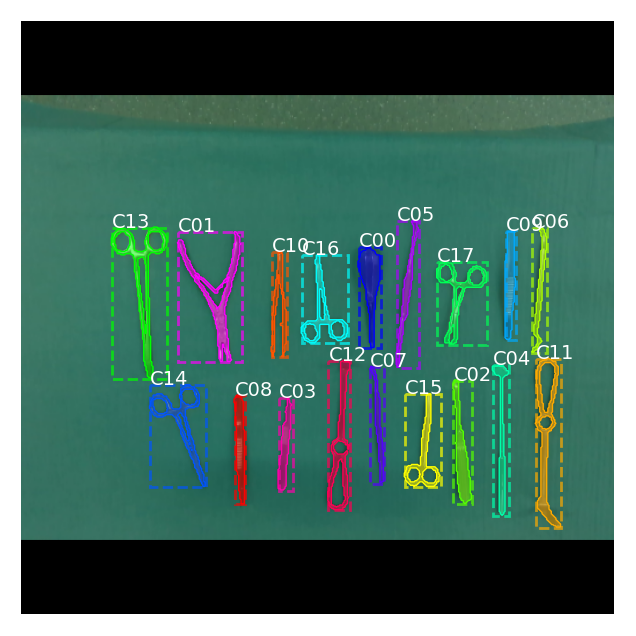

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
1
../CARS 2023/Test\rgb\A11_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


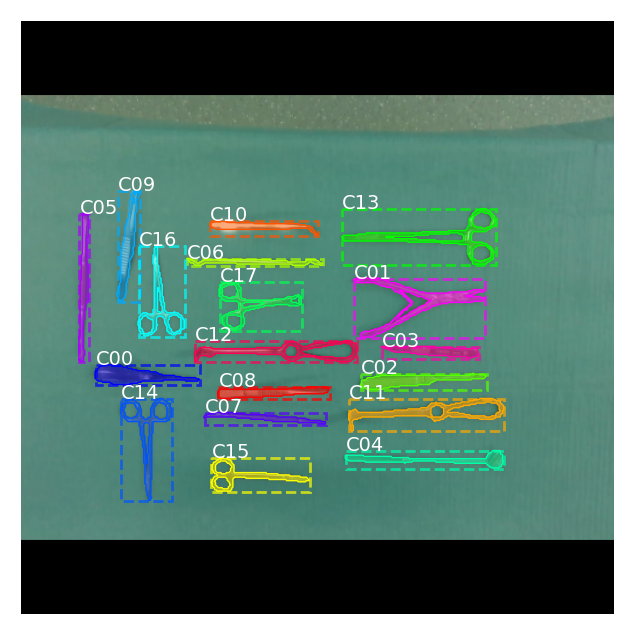

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
2
../CARS 2023/Test\rgb\A14_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


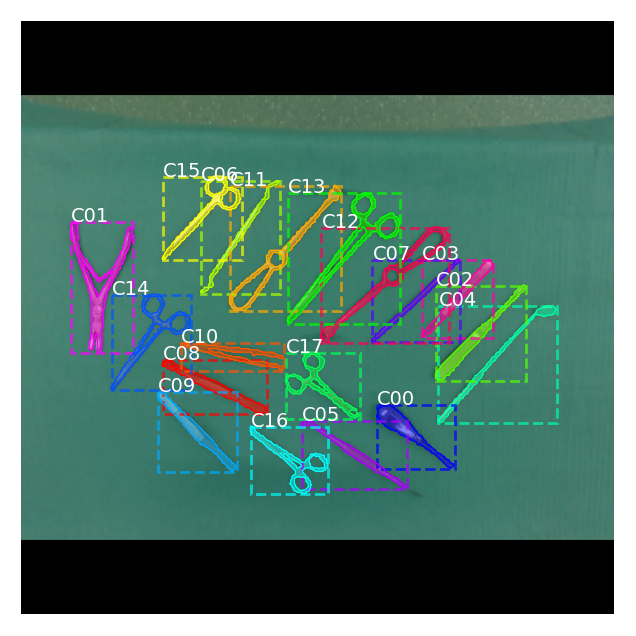

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
3
../CARS 2023/Test\rgb\A15_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


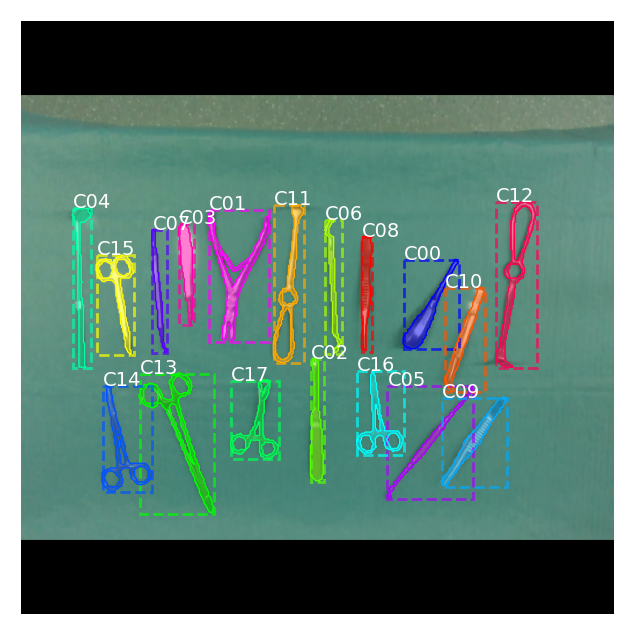

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
4
../CARS 2023/Test\rgb\A17_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


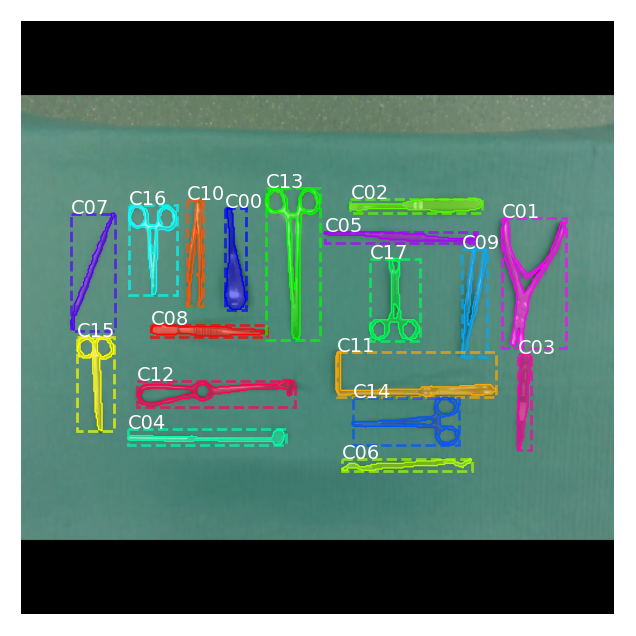

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
5
../CARS 2023/Test\rgb\A18_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


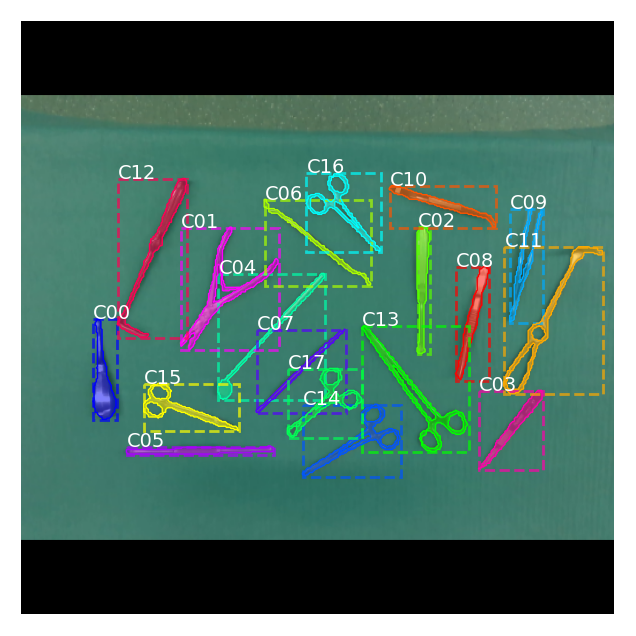

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
6
../CARS 2023/Test\rgb\A19_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


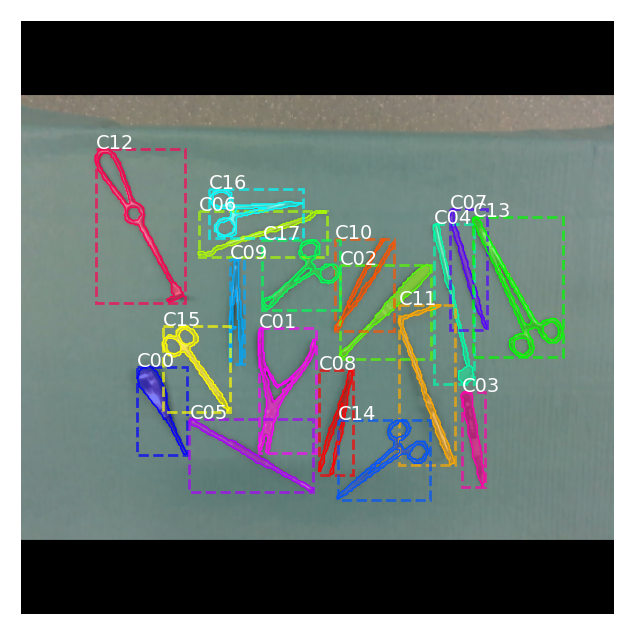

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
7
../CARS 2023/Test\rgb\A1_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


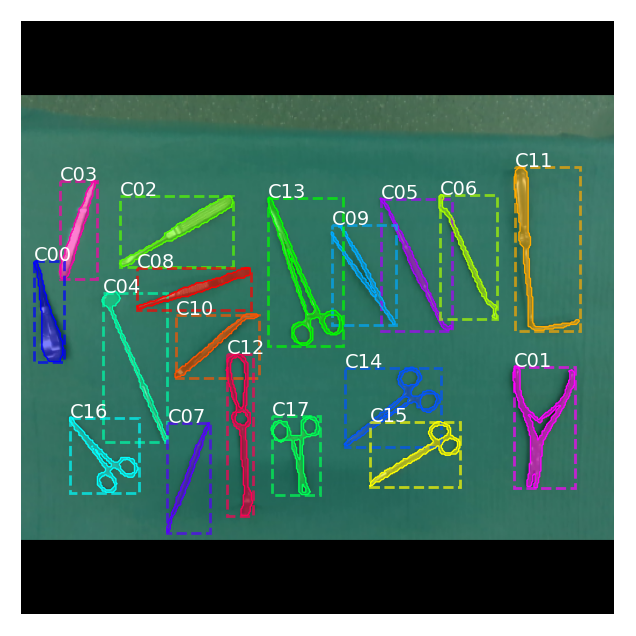

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
8
../CARS 2023/Test\rgb\A20_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


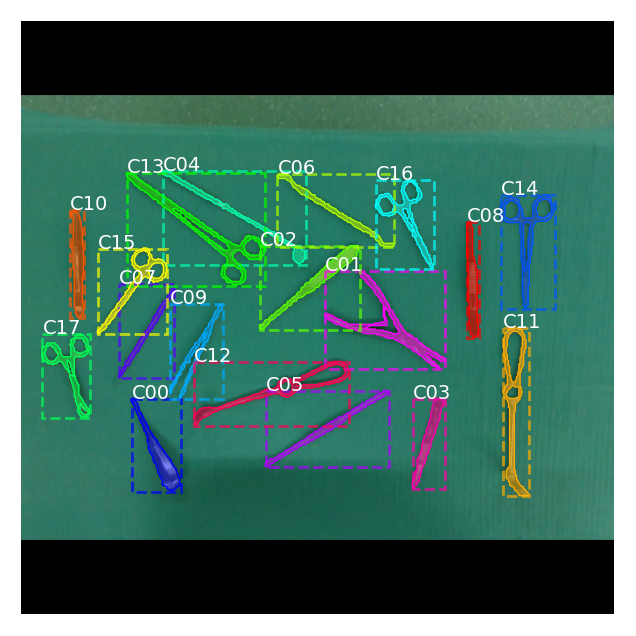

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
9
../CARS 2023/Test\rgb\A21_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


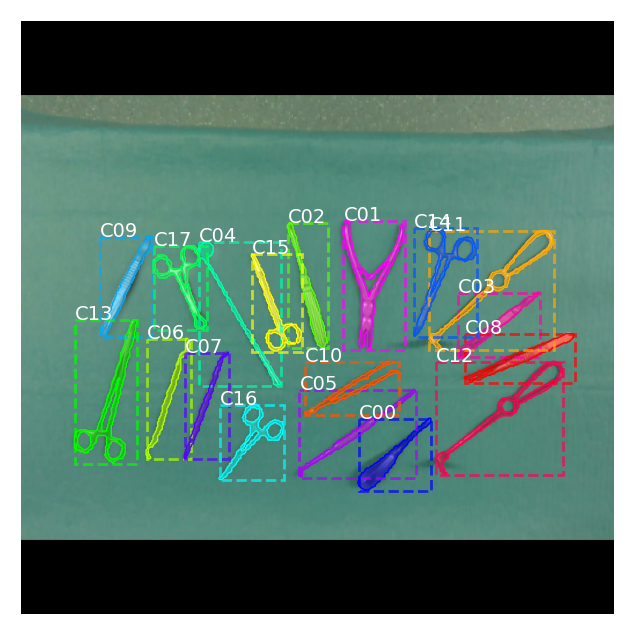

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
10
../CARS 2023/Test\rgb\A22_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


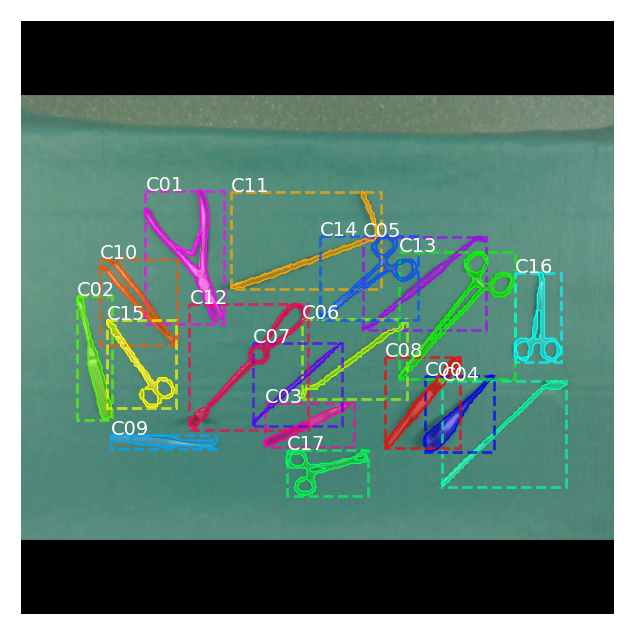

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
11
../CARS 2023/Test\rgb\A23_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


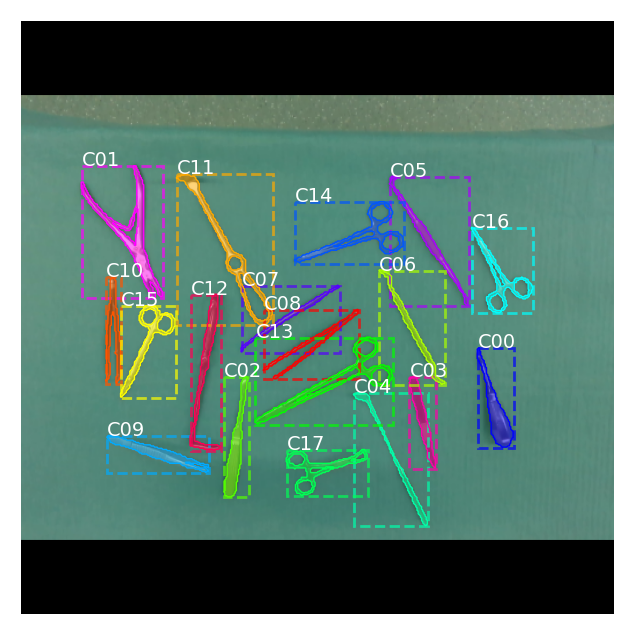

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
12
../CARS 2023/Test\rgb\A24_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


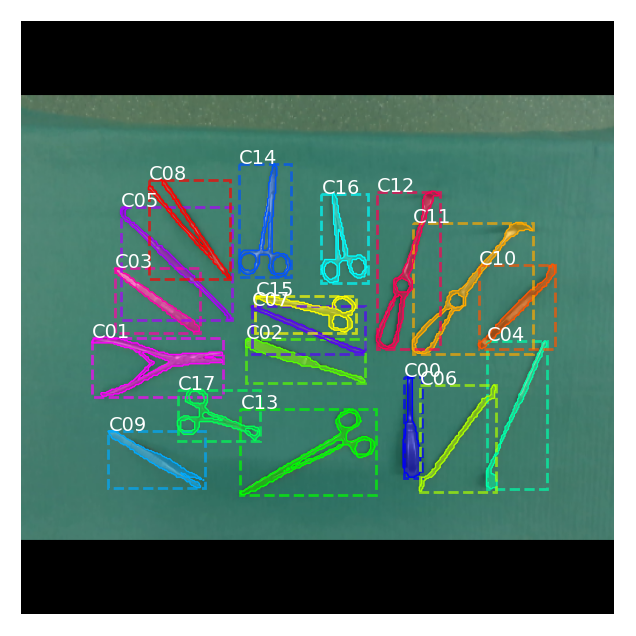

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
13
../CARS 2023/Test\rgb\A25_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


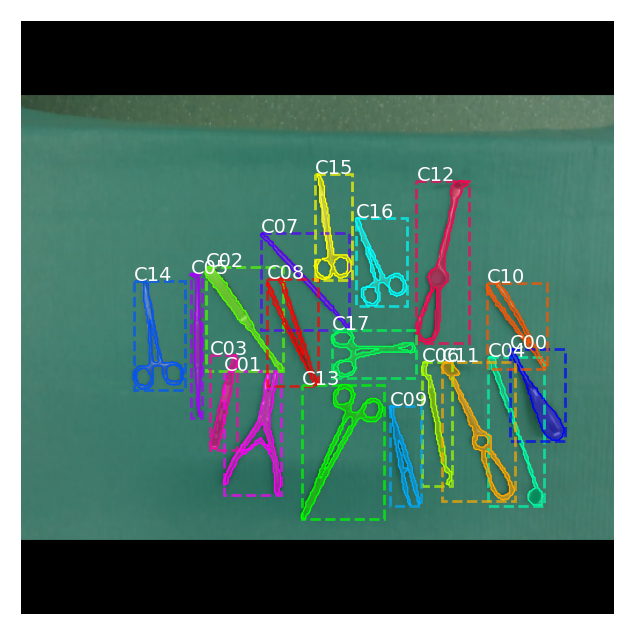

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
14
../CARS 2023/Test\rgb\A26_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


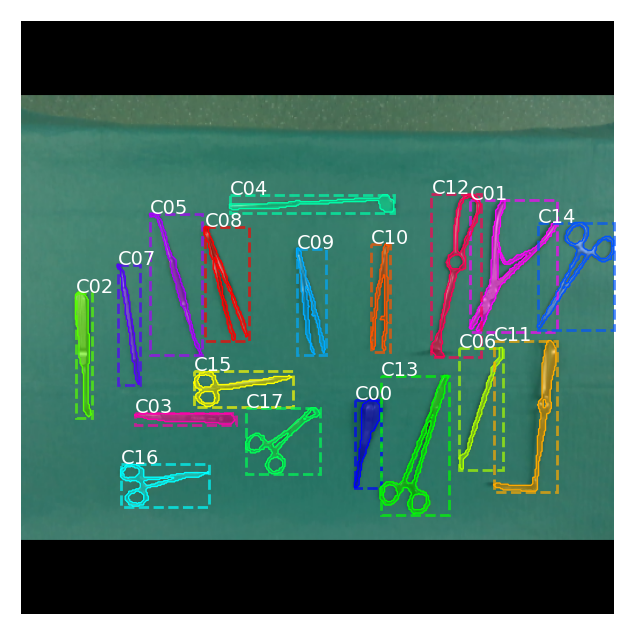

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
15
../CARS 2023/Test\rgb\A27_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


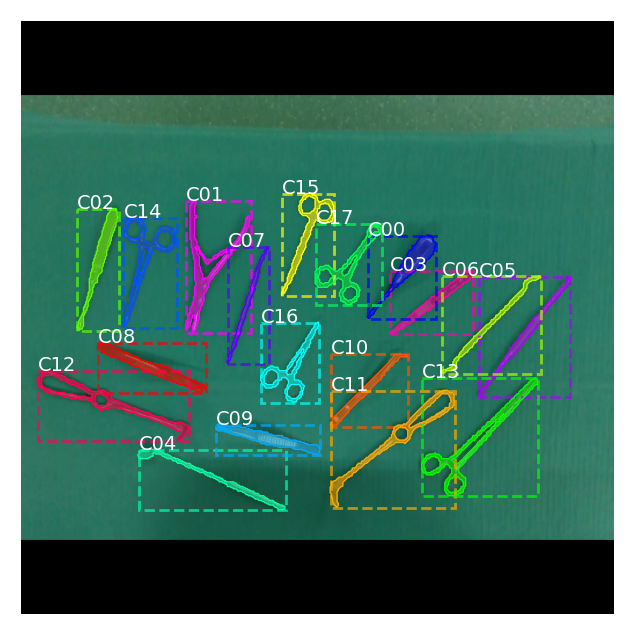

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
16
../CARS 2023/Test\rgb\A28_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


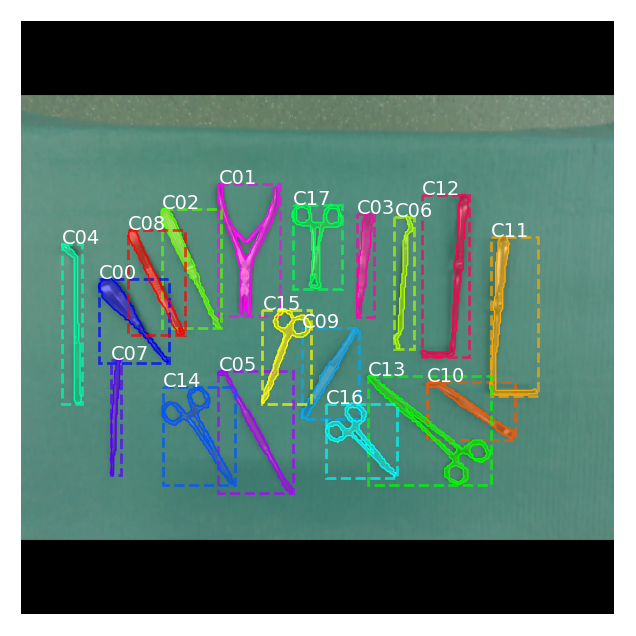

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
17
../CARS 2023/Test\rgb\A29_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


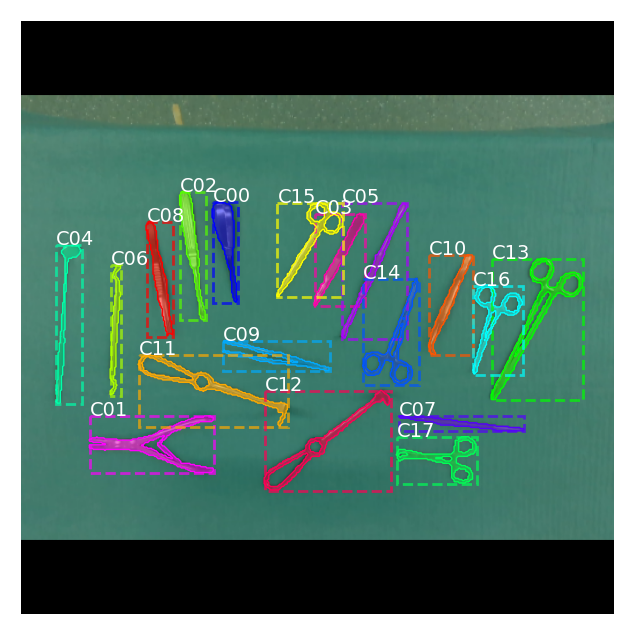

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18
../CARS 2023/Test\rgb\A2_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


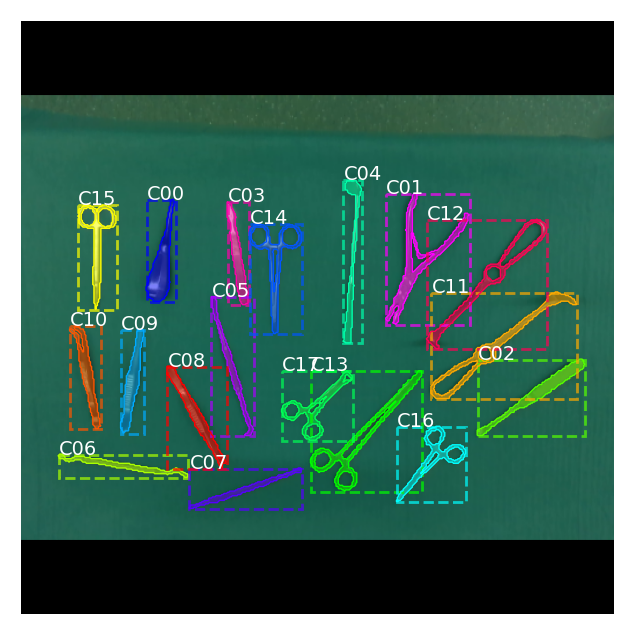

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
19
../CARS 2023/Test\rgb\A30_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


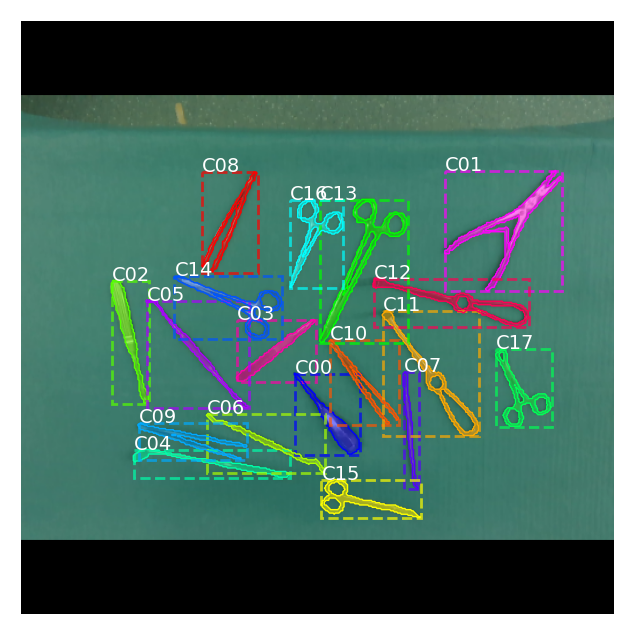

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
20
../CARS 2023/Test\rgb\A3_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


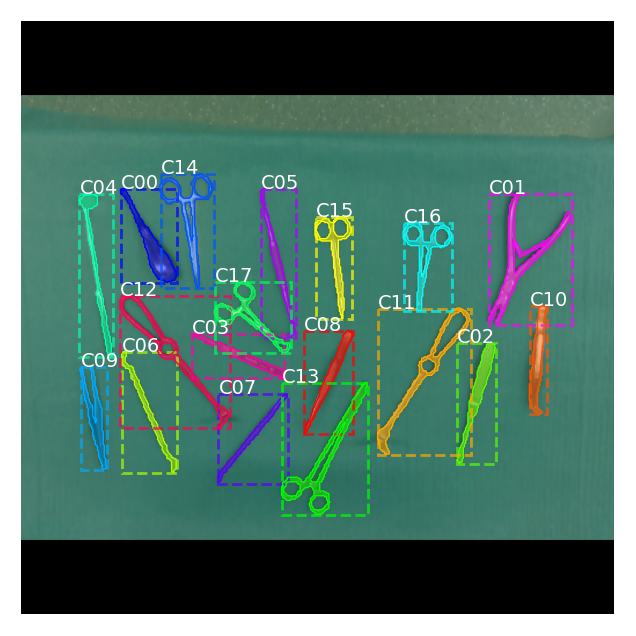

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
21
../CARS 2023/Test\rgb\A4_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


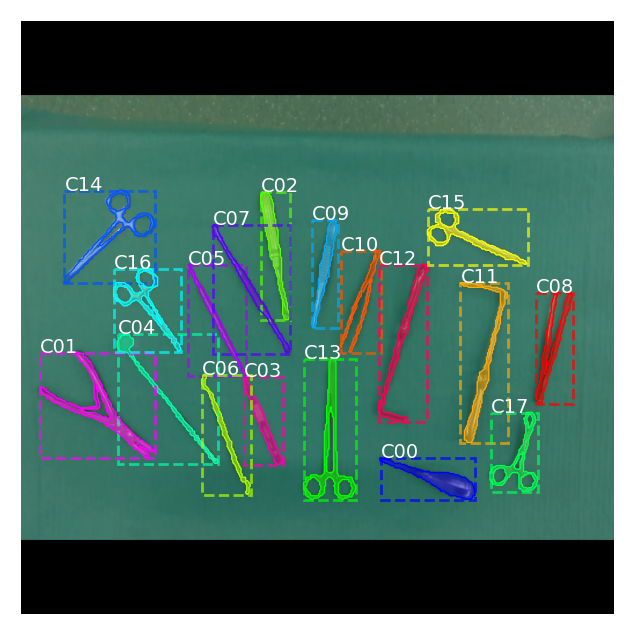

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
22
../CARS 2023/Test\rgb\A5_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


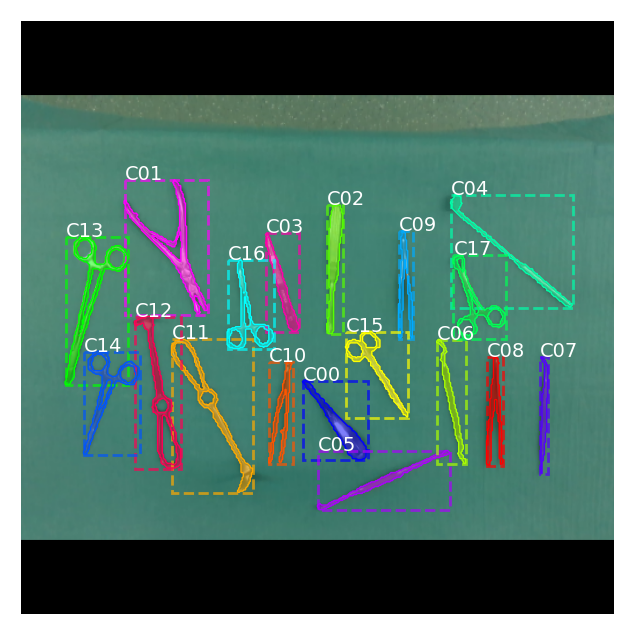

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
23
../CARS 2023/Test\rgb\A6_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


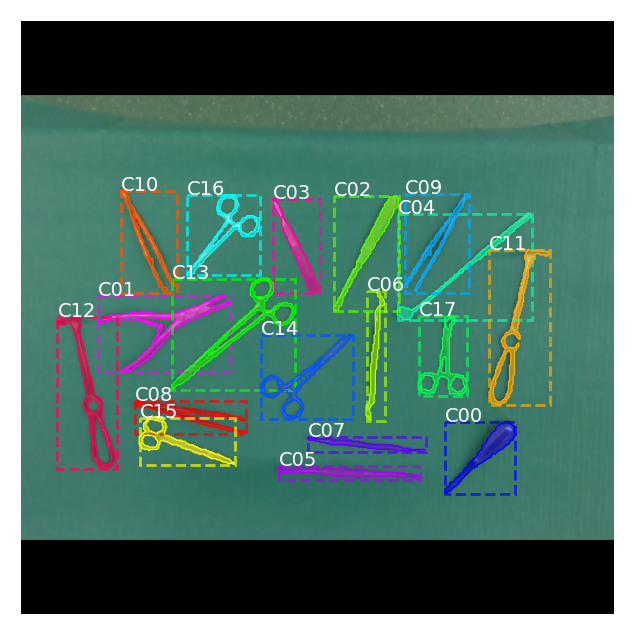

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
24
../CARS 2023/Test\rgb\A7_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


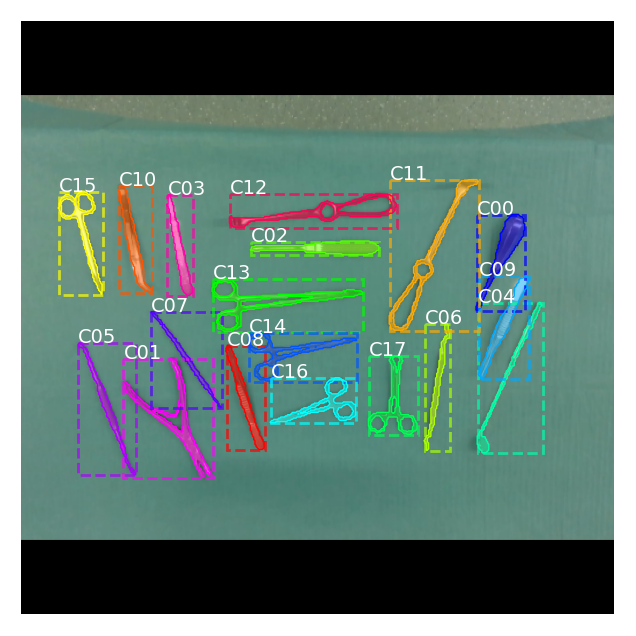

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
25
../CARS 2023/Test\rgb\A8_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


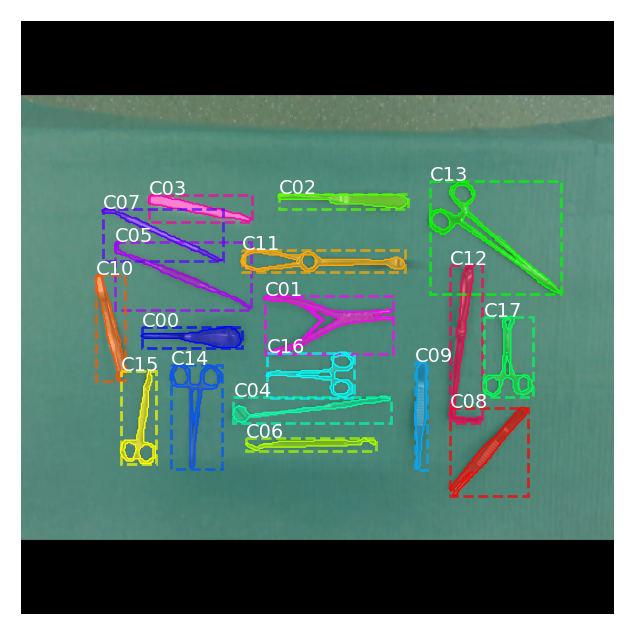

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
26
../CARS 2023/Test\rgb\A9_view_0.png
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]
18


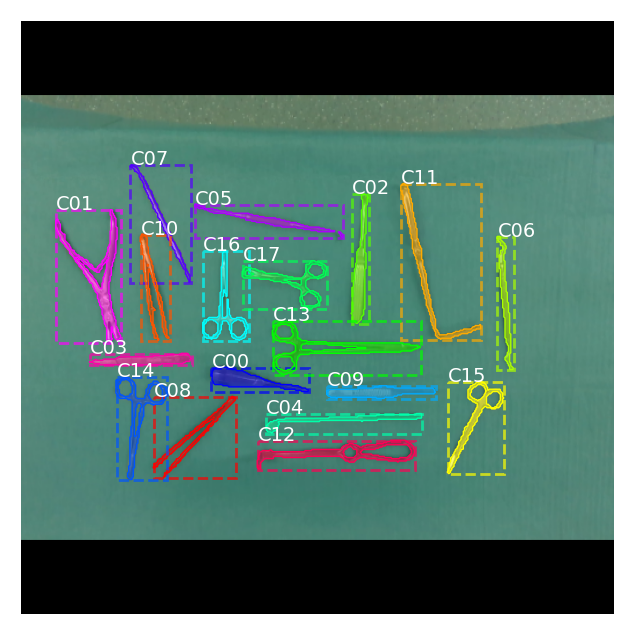

[ 5  2  3  4  1  6  7  8  9 10 11 12 13 14 15 16 17 18]


In [10]:
%matplotlib inline 
#notebook
map_height = 900
map_width = 1200
colors = [(0, 0, 255), (255, 0, 255), (85, 255, 0), (255, 0, 170), 
          (0, 255, 170), (170, 0, 255), (170, 255, 0), (85, 0, 1), 
          (255, 0, 0), (0, 170, 255), (255, 85, 0), (255, 170, 0), 
          (255, 0, 85), (0, 255, 0), (0, 85, 255), (255, 255, 0), 
          (0, 255, 255), (0, 255, 85)]

# colors = [(10, 10, 10), (20, 20, 20), (30, 30, 30), (40, 40, 40), 
#           (50, 50, 50), (60, 60, 60), (70, 70, 70), (80, 80, 80),
#           (90, 90, 90), (100, 100, 100), (110, 110, 110), (120, 120, 120),
#           (130, 130, 130), (140, 140, 140), (150, 150, 150), (160, 160, 160),
#           (170, 170, 170), (180, 180, 180)]


points_maps_gt = []
fov_maps_gt = []
fov_maps_gt_draw = []
ids_list_gt = []
fov_polygon_gt = []
points_polygons_gt = []
# mapped_points = []
# mapped_fov = []
for image_id in dataset_val.image_ids[0:]:
    print(image_id)
    image_path = dataset_val.image_info[image_id]['path']
    print(image_path)
    original_image, image_meta, temp_gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config, 
                               image_id, use_mini_mask=False)
    
    
    #======THIS BLOCK EXCHANGES THE ORDER OF THE INSTRUMENTS=====*
    k = 0
    print(temp_gt_class_id)    
    gt_class_id = temp_gt_class_id
    for cl_id in temp_gt_class_id:
        if cl_id == 1:
            gt_class_id[k] = 5
        elif cl_id == 5:
             gt_class_id[k] = 1
        k += 1
    print(gt_class_id)        
#============================================================*
    
    print(len(gt_class_id))
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset_val.class_names, figsize=(8, 8))

#     results = model.detect([original_image], verbose=0)
#     r = results[0]
    ids = gt_class_id
    masks = gt_mask
    print(gt_class_id)
#     visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
#                                 dataset_val.class_names, ax=get_ax())
    mask_bboxes, mask_windows = obtain_bboxes_from_masks(masks)
    bboxes_min = obtain_min_bboxes(mask_bboxes, mask_windows)
    new_rois = resize_rois(bboxes_min)
    index = int(image_path.split('view_')[1].split('.png')[0])
    poses = np.load(Pose_DIR + "\pose.npy") #Load the poses' file
    pose = poses[index] #Obtain the pose of the robot corresponding to the frame
    bboxes_points_base, field_of_view, field_of_view_draw = bboxes_to_points(new_rois, image_path, pose) #Transform the pixels of the bboxes to 3-D points
    mapped_points, mapped_fov, mapped_fov_draw = map_points(bboxes_points_base, field_of_view, field_of_view_draw, map_height, map_width)
#     print(np.shape(mapped_points))
    points_maps_gt.append(mapped_points[:, :, 0:2].astype(int))
#     print(np.shape(mapped_fov))
    fov_maps_gt.append(mapped_fov[:, 0:2, :].astype(int))
    fov_maps_gt_draw.append(mapped_fov_draw[:, 0:2, :].astype(int))
    ids_list_gt.append(ids)
    fov_p_gt = convert_points_to_polygon(mapped_fov[:, 0:2, :], fov = True)
#     fov_p = np.reshape(fov_p, [-1,1])
    points_p_gt = convert_bboxes_to_polygons(mapped_points[:, :, 0:2])
#     points_p = np.reshape(points_p, [-1,1])

    fov_polygon_gt.append(fov_p_gt)
    points_polygons_gt.append(points_p_gt)
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


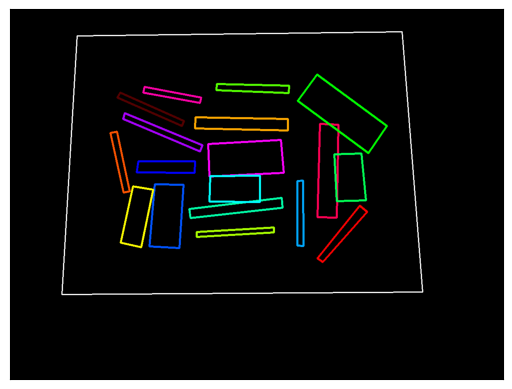

In [11]:
%matplotlib inline
# print(points_maps[0])
i = 0
for i in range(26):
    print(i)
    final_map = draw_map(points_maps_gt[i], fov_maps_gt_draw[i], ids_list_gt[i], colors, map_height, map_width, draw_fov = True)
#     plt.imshow(final_map)
#     plt.show()
    
    plt.tick_params(left = False, right = False , labelleft = False ,
            labelbottom = False, bottom = False)
    plt.savefig('gt'+str(i) +'map.png', bbox_inches='tight') 
    plt.imshow(final_map)
    
    
    

# Detection

In [19]:
class InferenceConfig(InstrumentsConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights

# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
#model_path = model.find_last()[1]
model_path = os.path.join(ROOT_DIR, "M1.h5") #Good:00001.h5 Bad: 0005.h5   "CaRS_0026.h5" "old" "CARS_0042.h5" "cars_0065.h5"
# 90_inst_4k_69.h5
# cars_2023_1.h5

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  C:\Users\joreb\Desktop\CARS 2023\M1.h5


In [20]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

# Preview of performance

# Test Dataset

In [21]:
DIR = '../CARS 2023/Arrangements/A29'  #Change depending on the working directory's name
Instruments_DIR = os.path.join(DIR, "rgb")
Mask_DIR = os.path.join(Instruments_DIR, "masks")
Pose_DIR = os.path.join(DIR, "pose")


# Validation dataset
config = Config()
dataset_test = InstrumentsDataset()
dataset_test.load_instruments(Instruments_DIR)
dataset_test.prepare()
#print(dataset_val.num_classes)

print("Image Count: {}".format(len(dataset_test.image_ids)))
print("Class Count: {}".format(dataset_test.num_classes))
for i, info in enumerate(dataset_test.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 133
Class Count: 19
  0. BG                                                
  1. C00                                               
  2. C01                                               
  3. C02                                               
  4. C03                                               
  5. C04                                               
  6. C05                                               
  7. C06                                               
  8. C07                                               
  9. C08                                               
 10. C09                                               
 11. C10                                               
 12. C11                                               
 13. C12                                               
 14. C13                                               
 15. C14                                               
 16. C15                                               
 17. C16       

0
../CARS 2023/Arrangements/A29\rgb\view_0.png

*** No instances to display *** 

random colors: []
hsv []


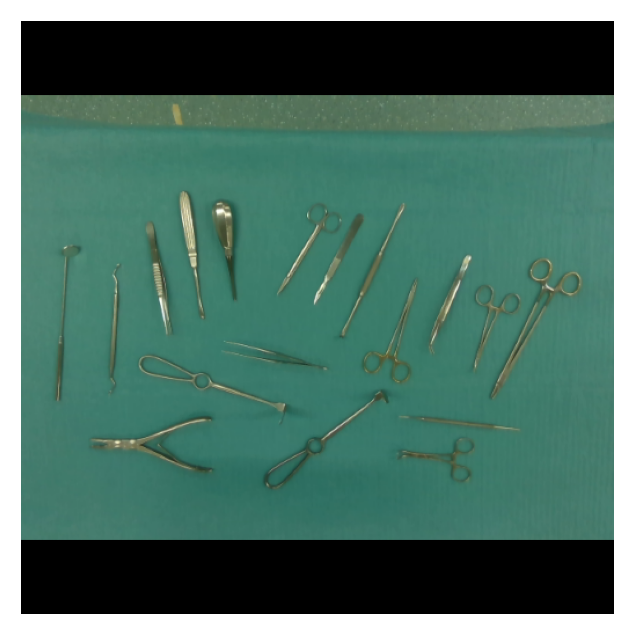

antes
[[228 390 300 428]
 [211  75 323  86]
 [226 294 313 344]
 [145 135 256 159]
 [340  61 391 163]
 [156 276 275 333]
 [341 327 355 430]
 [285 104 347 225]
 [192  29 327  51]
 [175 107 274 130]
 [321 210 406 315]
 [275 176 302 269]
 [207 401 330 483]
 [200 353 283 390]
 [157 166 241 187]
 [156 221 241 279]
 [360 324 401 390]
 [358 327 400 390]]
despues
[17  7 15  3  2  6  8 12  5 10 13 10 14  9  3 16 15 18]
[17  7 15  3  2  6  8 12  5 10 13 10 14  9  3 16 15 18]
1
../CARS 2023/Arrangements/A29\rgb\view_1.png

*** No instances to display *** 

random colors: []
hsv []


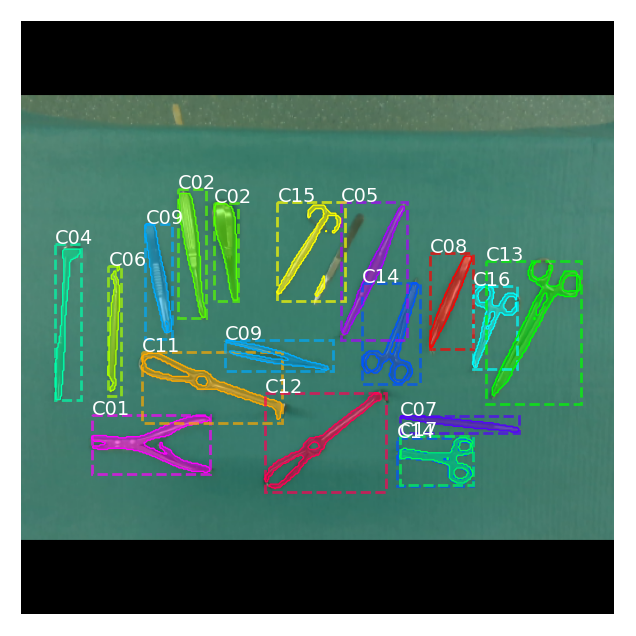

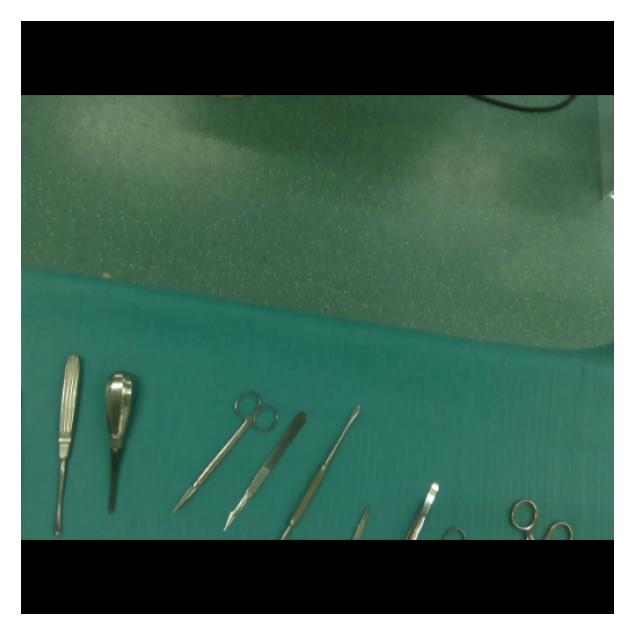

antes
[[321 130 424 220]
 [284  28 445  56]
 [332 221 449 294]
 [303  74 425 101]
 [340 176 441 250]
 [398 329 448 361]]
despues
[16  3  6  1  4 10]
[16  3  6  1  4 10]
2
../CARS 2023/Arrangements/A29\rgb\view_10.png

*** No instances to display *** 

random colors: []
hsv []


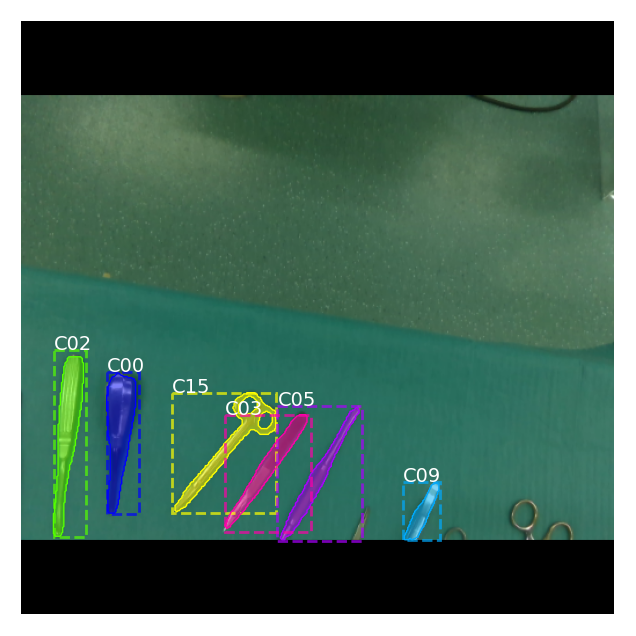

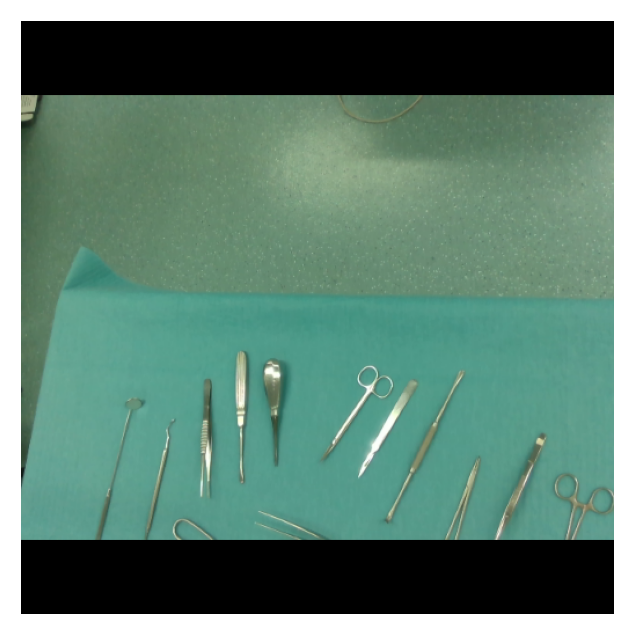

antes
[[301 314 437 386]
 [299 258 379 317]
 [309 289 394 345]
 [338 105 450 132]
 [392 461 448 511]
 [328  65 449 108]
 [358 406 451 453]
 [379 364 449 398]
 [310 153 410 166]
 [283 184 395 197]
 [283 183 396 196]
 [310 153 413 166]
 [294 208 385 225]]
despues
[ 6 16  4  7 17  6 11 10 10 10  3  9  3]
[ 6 16  4  7 17  6 11 10 10 10  3  9  3]
3
../CARS 2023/Arrangements/A29\rgb\view_100.png

*** No instances to display *** 

random colors: []
hsv []


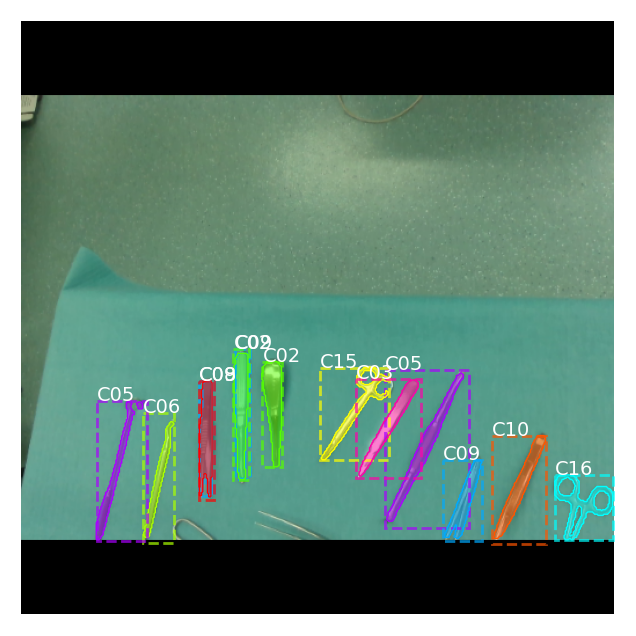

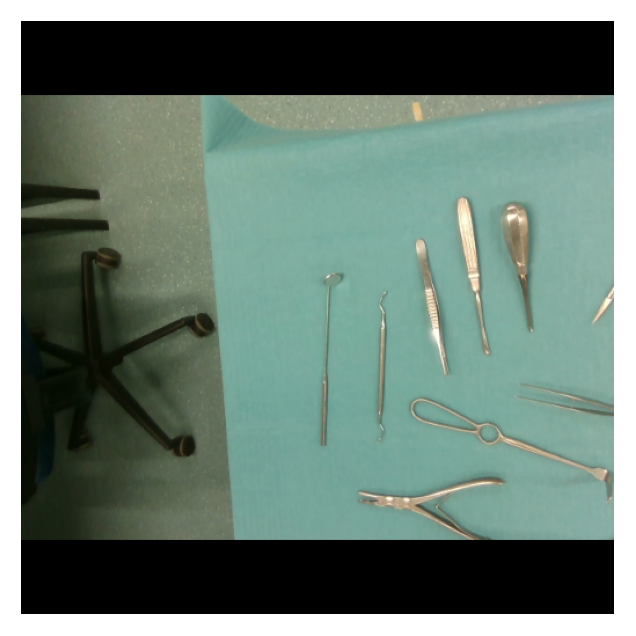

antes
[[394 291 449 415]
 [232 307 365 317]
 [153 376 290 405]
 [217 260 363 277]
 [158 414 270 443]
 [189 341 307 369]
 [323 335 416 507]
 [313 430 342 512]]
despues
[ 2  7  3  5  1 10 13  9]
[ 2  7  3  5  1 10 13  9]
4
../CARS 2023/Arrangements/A29\rgb\view_101.png

*** No instances to display *** 

random colors: []
hsv []


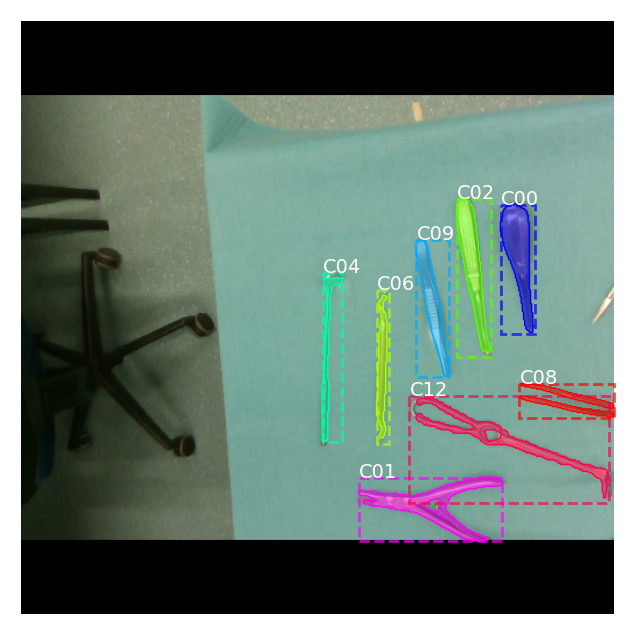

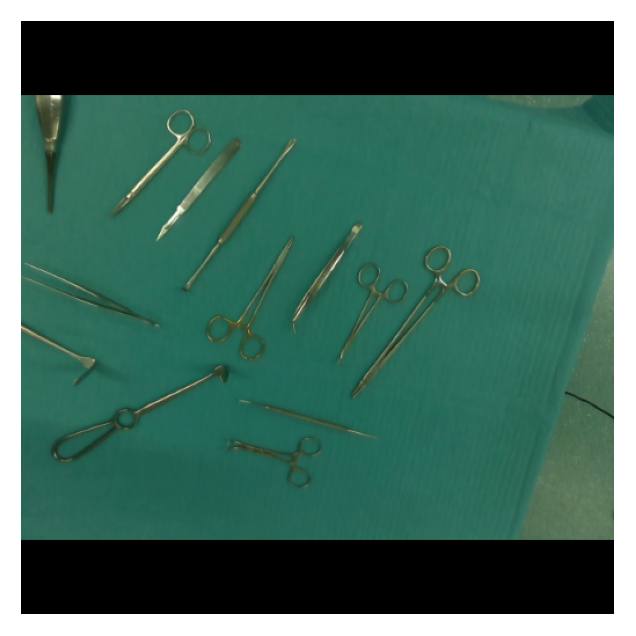

antes
[[ 75  76 170 162]
 [325 186 363 306]
 [189 161 296 237]
 [194 282 330 397]
 [297  24 382 180]
 [ 99 142 234 240]
 [207   1 265 121]
 [359 176 405 258]
 [210 274 296 334]
 [105 119 187 193]
 [ 66  16 167  38]
 [175 228 269 297]
 [175 231 262 297]]
despues
[16  8 15 14 13  6 10 18 17  4  1 11  9]
[16  8 15 14 13  6 10 18 17  4  1 11  9]
5
../CARS 2023/Arrangements/A29\rgb\view_102.png

*** No instances to display *** 

random colors: []
hsv []


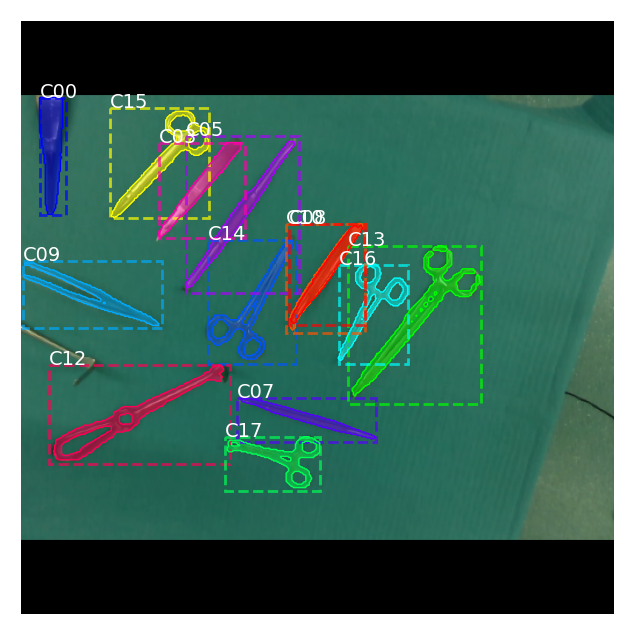

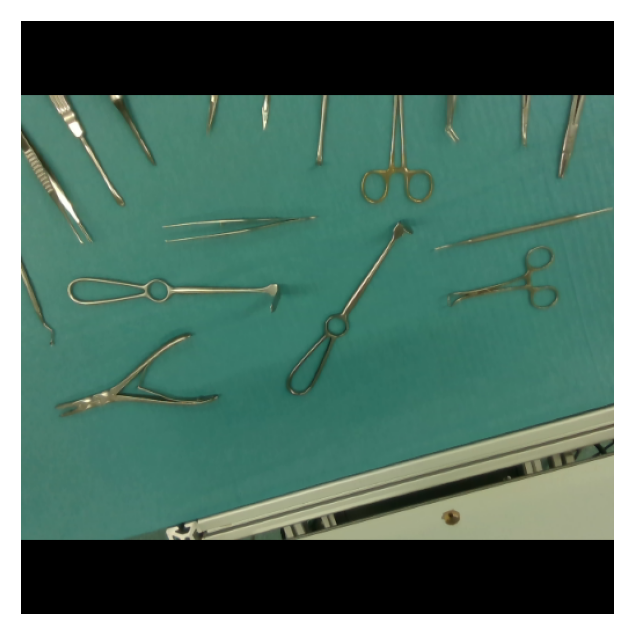

antes
[[271  29 341 171]
 [ 64 292 160 357]
 [221  44 250 221]
 [159 356 199 510]
 [195   0 280  29]
 [175 229 325 335]
 [167 124 192 255]
 [194 367 250 462]
 [ 82   1 196  58]]
despues
[ 2 15 12  8  7 13 10 15  9]
[ 2 15 12  8  7 13 10 15  9]
6
../CARS 2023/Arrangements/A29\rgb\view_103.png

*** No instances to display *** 

random colors: []
hsv []


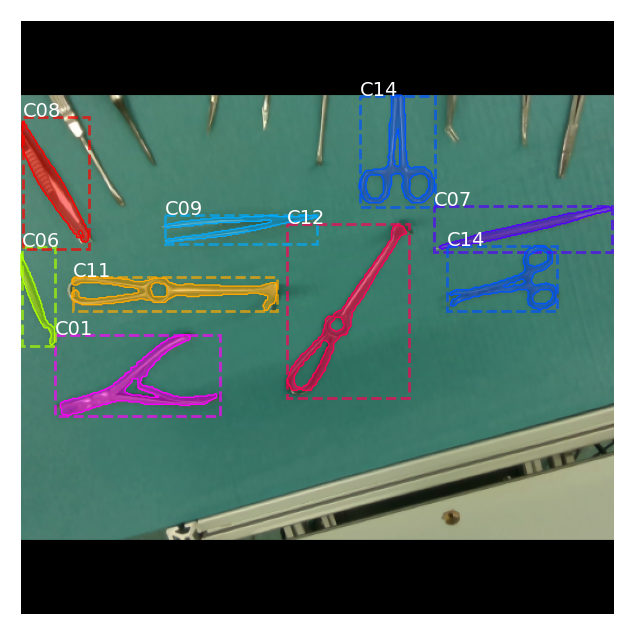

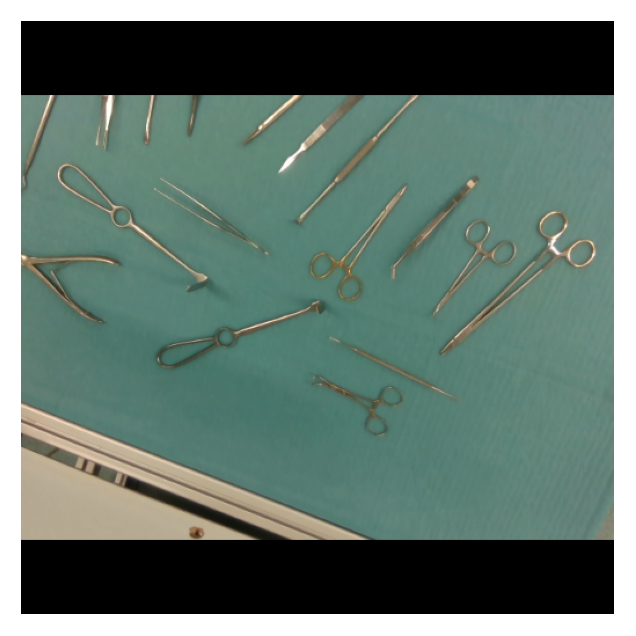

antes
[[171 358 259 432]
 [135 318 224 397]
 [273 267 328 378]
 [199   0 261  83]
 [ 61 238 178 346]
 [162 361 288 496]
 [305 250 360 328]
 [143 250 246 335]
 [122  33 232 160]
 [137 116 202 215]
 [ 63 223 131 298]
 [242 115 301 260]
 [ 62   0 149  31]]
despues
[17 11  8  2  6 14 18 15 12 10  4 13  7]
[17 11  8  2  6 14 18 15 12 10  4 13  7]
7
../CARS 2023/Arrangements/A29\rgb\view_104.png

*** No instances to display *** 

random colors: []
hsv []


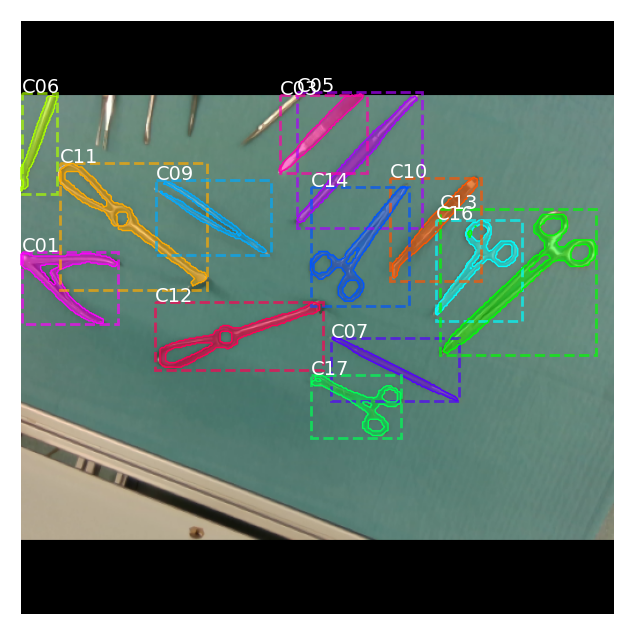

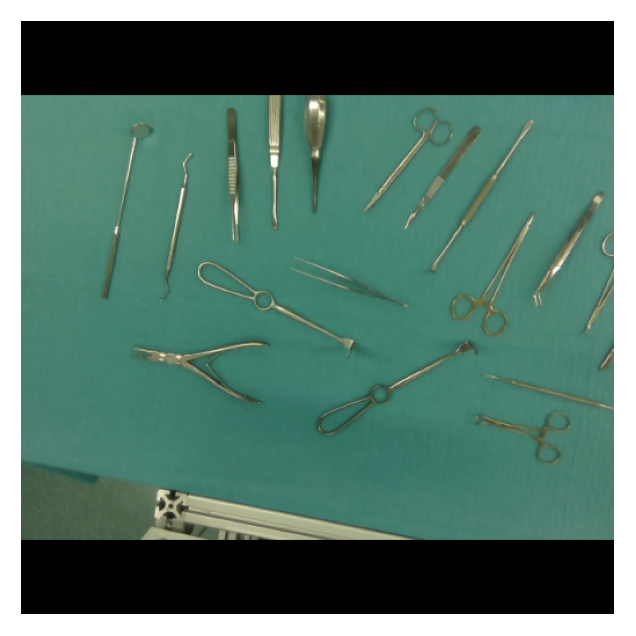

antes
[[111 122 243 149]
 [169 372 274 447]
 [146 440 251 503]
 [275  98 332 210]
 [ 72 295 164 374]
 [ 82 352 222 448]
 [304 396 337 510]
 [205 153 291 286]
 [ 66 245 167 265]
 [ 91 333 182 401]
 [203 236 249 337]
 [ 86  69 239 116]
 [ 67 212 178 227]
 [ 75 177 191 190]
 [277 255 359 395]
 [336 391 384 472]
 [337 389 383 473]]
despues
[ 7 15 11  2 16  6  8 12  1  4 10  5  3 10 12 18 15]
[ 7 15 11  2 16  6  8 12  1  4 10  5  3 10 12 18 15]
8
../CARS 2023/Arrangements/A29\rgb\view_105.png

*** No instances to display *** 

random colors: []
hsv []


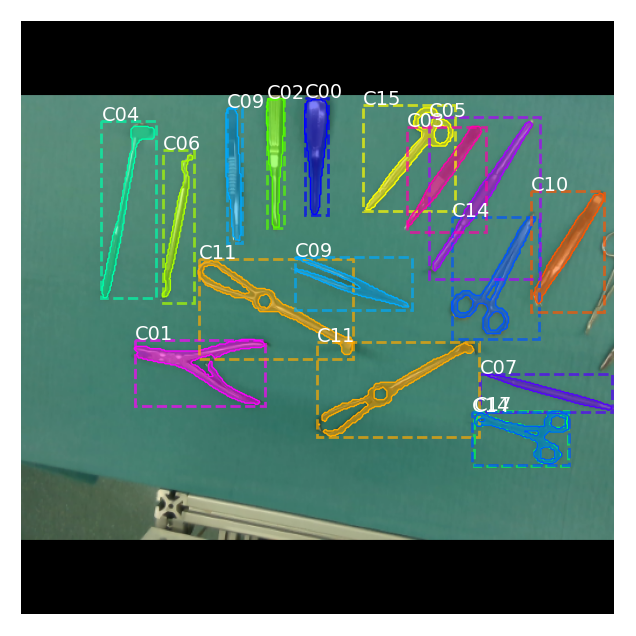

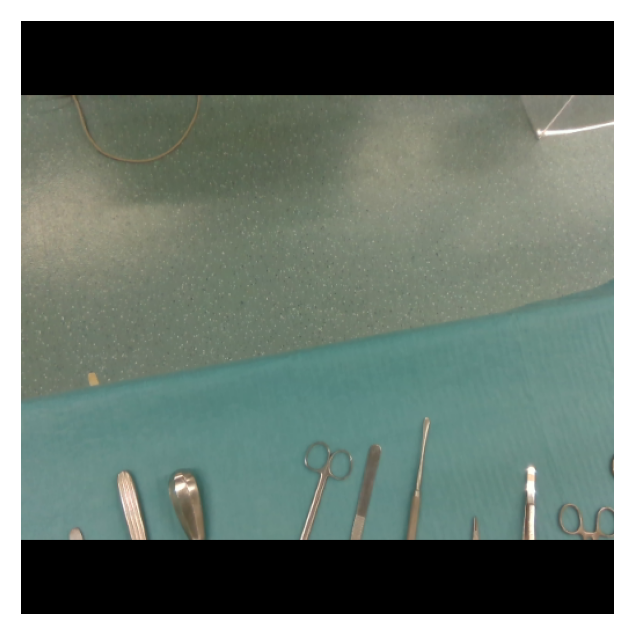

antes
[[362 240 449 287]
 [389 127 447 161]
 [388  82 449 111]
 [364 284 447 311]
 [344 332 447 354]
 [384 433 448 446]
 [418 463 448 512]
 [415 463 448 512]]
despues
[16  1  3  4  6  4 17 16]
[16  1  3  4  6  4 17 16]


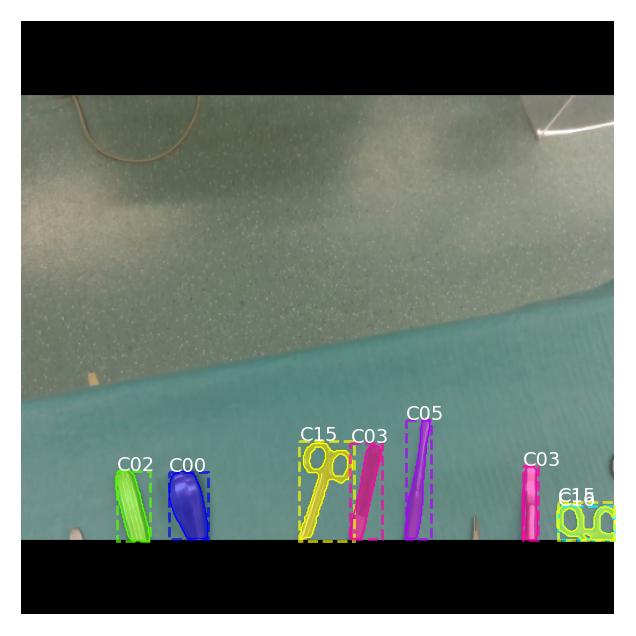

In [23]:
%matplotlib inline
map_height = 900
map_width = 1200
colors = [(0, 0, 255), (255, 0, 255), (85, 255, 0), (255, 0, 170), 
          (0, 255, 170), (170, 0, 255), (170, 255, 0), (85, 0, 1), 
          (255, 0, 0), (0, 170, 255), (255, 85, 0), (255, 170, 0), 
          (255, 0, 85), (0, 255, 0), (0, 85, 255), (255, 255, 0), 
          (0, 255, 255), (0, 255, 85)]

# colors = [(10, 10, 10), (20, 20, 20), (30, 30, 30), (40, 40, 40), 
#           (50, 50, 50), (60, 60, 60), (70, 70, 70), (80, 80, 80),
#           (90, 90, 90), (100, 100, 100), (110, 110, 110), (120, 120, 120),
#           (130, 130, 130), (140, 140, 140), (150, 150, 150), (160, 160, 160),
#           (170, 170, 170), (180, 180, 180)]


points_maps = []
fov_maps = []
fov_maps_draw = []
ids_list = []
fov_polygon = []
points_polygons = []
# mapped_points = []
# mapped_fov = []
for image_id in dataset_test.image_ids[0:9]:
    print(image_id)
    image_path = dataset_test.image_info[image_id]['path']
    print(image_path)
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_test, inference_config, 
                               image_id, use_mini_mask=False)

    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset_test.class_names, figsize=(8, 8))

    results = model.detect([original_image], verbose=0)

    
    print('antes')
#     print(r['class_ids'])    
#======THIS BLOCK EXCHANGES THE ORDER OF THE INSTRUMENTS=====*
    r = results[0]
    
    print(r['rois'])
    
    k = 0
    for cl_id in results[0]['class_ids']:
        if cl_id == 1:
            r['class_ids'][k] = 5
        elif cl_id == 5:
            r['class_ids'][k] = 1
        k += 1
#     print(r['class_ids'])
#============================================================*
    print('despues')
    print(r['class_ids'])
    
    
    
    
    
    
    ids = r['class_ids']
    masks = r['masks']
    print(ids)
#     print(masks[16])
    
#     print(any(masks[16]))
    
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset_test.class_names, ax=get_ax())
    mask_bboxes, mask_windows = obtain_bboxes_from_masks(masks)
    bboxes_min = obtain_min_bboxes(mask_bboxes, mask_windows)
    new_rois = resize_rois(bboxes_min)
    index = int(image_path.split('view_')[1].split('.png')[0])
    poses = np.load(Pose_DIR + "\pose.npy") #Load the poses' file
    pose = poses[index] #Obtain the pose of the robot corresponding to the frame
    
    bboxes_points_base, field_of_view, field_of_view_draw = bboxes_to_points(new_rois, image_path, pose) #Transform the pixels of the bboxes to 3-D points
    mapped_points, mapped_fov, mapped_fov_draw = map_points(bboxes_points_base, field_of_view, field_of_view_draw, map_height, map_width)
#     print(np.shape(mapped_points))

    points_maps.append(mapped_points[:, :, 0:2].astype(int))
#     print(np.shape(mapped_fov))
    fov_maps.append(mapped_fov[:, 0:2, :].astype(int))
    fov_maps_draw.append(mapped_fov_draw[:, 0:2, :].astype(int))
    ids_list.append(ids)
    fov_p = convert_points_to_polygon(mapped_fov[:, 0:2, :], fov = False)

    points_p = convert_bboxes_to_polygons(mapped_points[:, :, 0:2])

    fov_polygon.append(fov_p)
    points_polygons.append(points_p)
    
    

## Voting and Matching

# Finish fixing!!!!!!!!!!!!!!!!!!

In [24]:
def candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold):
    candidates = [] #Polygons will be added to this list. Matching polygons will be grouped together
    votes = [] #Votes in the form of ids (hard voting) will be added to this list and they will correspond to the candidates list

    for i in range(num_views):
        partial_candidates = []
        partial_votes = []
        c = 0 #counter 
        Int = []
        matched_poly_1 = []
        matched_poly_2 = []
        ids_comb = list(combinations(ids_list[i], 2)) #Combinations of the current predicted ids

        poly_comb = list(combinations(points_polygons[i], 2)) #Combinations of the current predicted polygons
        intersection = False
        Not_matched = True
        for n in range(len(poly_comb)): #Loop over all combinations of polygons

            if intersection == False:
                Not_matched = True

            if ids_comb[n][0] == ids_list[i][c]: #While the first term of the combination remains the same
                IoU = Intersection_over_Union(poly_comb[n][0], poly_comb[n][1])

                if IoU > threshold:

                    intersection = True
                    if i == 0:
                        candidates.append([poly_comb[n][0], poly_comb[n][1]])
                        votes.append([ids_comb[n][0], ids_comb[n][1]])

                    else:
                        partial_candidates.append([poly_comb[n][0], poly_comb[n][1]])
                        partial_votes.append([ids_comb[n][0], ids_comb[n][1]])

                    Not_matched = False
                    matched_poly_1 = poly_comb[n][0]
                    matched_poly_2 = poly_comb[n][1]
                else:
                    intersection = False
                try:
                    if poly_comb[n+1][0] != points_polygons[i][c] and intersection == False and Not_matched == True \
                        and poly_comb[n][0] != matched_poly_1 and poly_comb[n][0] != matched_poly_2: 
                        c += 1
                        if i == 0:
                            candidates.append([poly_comb[n][0]])
                            votes.append([ids_comb[n][0]])
                        else:
                            partial_candidates.append([poly_comb[n][0]])
                            partial_votes.append([ids_comb[n][0]])
                    elif poly_comb[n+1][0] != points_polygons[i][c]:
                        c += 1

                except:
                    if Not_matched == True and i == 0:

                        In_candidates = False
                        for candidate in candidates:
                            if poly_comb[n][0] in candidate:
                                In_candidates = True
                        if In_candidates == False:
                            candidates.append([poly_comb[n][0]])
                            votes.append([ids_comb[n][0]])

                        In_candidates = False
                        for candidate in candidates:
                            if poly_comb[n][1] in candidate:
                                In_candidates = True
                        if In_candidates == False:
                            candidates.append([poly_comb[n][1]])
                            votes.append([ids_comb[n][1]])
                        continue

                    if Not_matched == True and i != 0:# and n + 1 != len(poly_comb):
                        In_candidates = False
                        for partial_candidate in partial_candidates:
                            if poly_comb[n][0] in partial_candidate:
                                In_candidates = True
                        if In_candidates == False:
                            partial_candidates.append([poly_comb[n][0]])
                            partial_votes.append([ids_comb[n][0]])

                        In_candidates = False
                        for partial_candidate in partial_candidates:
                            if poly_comb[n][1] in partial_candidate:
                                In_candidates = True
                        if In_candidates == False:
                            partial_candidates.append([poly_comb[n][1]])
                            partial_votes.append([ids_comb[n][1]])
                        continue
        if i != 0:

            candidates_in_fov = []
            votes_in_fov = []
            for j in range(len(candidates)):
                for k in range(len(candidates[j])):
                    inter = fov_polygon[i].intersection(candidates[j][k]).area

                    if inter > threshold*candidates[j][k].area:
                        candidates_in_fov.append([candidates[j][k]])
                        votes_in_fov.append([votes[j][k]])

            for u in range(len(partial_candidates)):
                IoU_max = 0
                matched = False
                for v in range(len(candidates_in_fov)):
                    IoU = Intersection_over_Union(partial_candidates[u][0], candidates_in_fov[v][0])
                    if IoU > threshold and IoU > IoU_max:
                        IoU_max = IoU
                        paired_indeces = [u, v]
                        matched = True
                if matched == True:#append matched partial candidate to candidate in the position corresponding to the matched candidate
                    for c in range(len(candidates)):
                        if candidates_in_fov[paired_indeces[1]][0] in candidates[c]:
                            for l in range(len(partial_candidates[paired_indeces[0]][:])):
                                candidates[c].append(partial_candidates[paired_indeces[0]][l])
                                votes[c].append(partial_votes[paired_indeces[0]][l])

                else: #append unmatched partial candidate to candidates as a new candidate
                    candidates.append(partial_candidates[u])
                    votes.append(partial_votes[u])
#     print(votes)
    return candidates, votes

In [25]:
def find_most_common_vote(vote, numbers):
    counts = {}
    
    # Count the occurrences of each integer in the list
    for num in vote:
        if num not in numbers:
            if num in counts:
                counts[num] += 1
            else:
                counts[num] = 1
#     print(counts)
    # Find the integer with the maximum count
    max_count = 0
    most_abundant = None
    repeated = False

    for num, count in counts.items():
#         print('max_count', max_count)
#         print('count', count)
        if count > max_count:
            max_count = count
            pred_vote = num
        elif count == max_count:
            repeated = True
#     vote_count = {"vote": pred_vote, "count": max_count}

    if repeated:
        vote_count = []
        
    else:
        vote_count = [pred_vote, max_count]

        
    return vote_count


# Example usage
vote = [1,1,1,2,3,7,7,8,8,8]
# # vote = [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10, 10]
# vote = [10, 10, 10, 10, 10, 10, 10, 10]
# vote = []

numbers = [10]
result = find_most_common_vote(vote, numbers)
print("The most abundant integer is:", result)

The most abundant integer is: []


# Note for me: I need to figure out how to deal with the repeated candidates that have equal amounts of votes

i need to remove the votes from the unassigned candidates, if i dont i get incorrect assignment as shown in the example below

In [26]:
def find_sublist_indexes(lst, sublist):
    indexes = []
    sublist_length = len(sublist)
    for i in range(len(lst) - sublist_length + 1):
        if lst[i:i+sublist_length] == sublist:
            indexes.append(i)
    return indexes

# Example usage
my_list = [[1, 2], [3, 4], [5, 6], [2, 3], [4, 5], [2, 3], [4, 5]]
my_list = [[6], [11], [13], [10], [12], [15], [16], [1], [17], [3], [7], [9], [14], [2], [4], [8], [5], [17]]
sub = [[17]]
indexes = find_sublist_indexes(my_list, sub)
print("Indexes of sublist:", indexes)

Indexes of sublist: [8, 17]


In [27]:
def find_sublist_indexes(lst, sublist):
    indexes = []
    sublist_length = len(sublist)
    for i in range(len(lst) - sublist_length + 1):
        if lst[i:i+sublist_length] == sublist:
            indexes.append(i)
    return indexes

# Example usage
my_list = [1, 2, 3, 4, 5, 2, 3, 4, 5, 2, 3]
my_list = [[6], [11], [13], [10], [12], [15], [16], [1], [17], [3], [7], [9], [14], [2], [4], [8], [5], [17]]
sub = [2, 3]
indexes = find_sublist_indexes(my_list, sub)
print("Indexes of sublist:", indexes)

Indexes of sublist: []


# New voting scheme

In [28]:
def vote_counting(candidates, votes, classes):
#     print('new one')
    "find the candidate with the higher number of votes for any class"
    numbers = []
    final_class_to_candidate = []
    empty = []
    associated = []
    for h in range(18):           #change 18 to a proper variable
        final_class_to_candidate.append([])
    for h in range(18):           #change 18 to a proper variable

        vote_counts = []
        for vote_ind in range(len(votes)):

            try:
#                 print('--------------------------------')
#                 print('numbers: ', numbers)
                vote_count = find_most_common_vote(votes[vote_ind], numbers)
#                 vote_counts.append(vote_count)
#                 print("ihiuheiuhiureh")
#                 print(associated)
#                 print(vote_ind)
#                 print("ihiuheiuhiureh")
#                 print('vote_ind: ', vote_ind)
#                 print('associated: ', associated)
                if [vote_ind] not in associated:
#                     print('got in')
                    
                    vote_counts.append(vote_count)
                else:
                    vote_counts.append([])
            except:
                vote_counts.append([])
                continue
        
        max_candidate = [0,0]
        
        for i in range(len(vote_counts)):
            try:
                if vote_counts[i][1] > max_candidate[1]:
                    max_candidate = vote_counts[i]
#         '''Find the most suitable candidate
            except:
                continue
#         print('--------------')
#         print('vote counts: ',vote_counts)
#         print('--------------')
#         print('---------------------------------')
#         print('vote_counts: ', vote_counts)
#         print('max_candidate: ', max_candidate)
#         print('associated: ', associated)
#         print('final_class_to_candidate: ', final_class_to_candidate)
#         print('---------------------------------')
        if max_candidate in vote_counts:
#             print('heeheheheheheheh')
#             index = vote_counts.index(max_candidate)
#             numbers.append(max_candidate[0])
#             print(max_candidate) 



#             index = vote_counts.index(max_candidate)
    
            index = find_sublist_indexes(vote_counts, [max_candidate])
#             print('index: ', index)

            #if theres no conflict--------------------------------------------
            if len(index) == 1:
    #             print('index: ', index)
                if index not in final_class_to_candidate:

                    numbers.append(max_candidate[0])
    #                 print(max_candidate) 
                    final_class_to_candidate[max_candidate[0]-1] = index 
                    associated.append(index)
            
            
            #if theres conflict--------------------------------------------
            else:
#                 print('hehehe==========================================================================')
                counts = []
#                 print('index: ', index)
                for i in index:
                    num = numbers
                    num.append(max_candidate[0])
#                     print(votes[i])
#                     print('num: ', num)
                    try:
                        vote_count0 = find_most_common_vote(votes[i], num)
                        counts.append(vote_count0)
                    except:
#                         print('yo???')
                        vote_count0 = [0, 0]
                        counts.append(vote_count0)
#                     print('votes: ', votes[i])
                    
#                 print('counts: ', counts)
#                 print('index: ', index)
                j = 0
                for i in index:
#                     print('here???')
                    if [0, 0] in counts:
                        if [0, 0] == counts[j]:
                            final_class_to_candidate[max_candidate[0]-1] = [i]
                            associated.append([i])
                            numbers.append(max_candidate[0])
                        
                        else:
                            final_class_to_candidate[counts[j][0]-1] = [i]
                            associated.append([i])
                            numbers.append(counts[j][0])
                    
                    else:
#                         print('ggggggg')
                        c = [0, 100000]
#                         print('counts:', counts)
                        for count in counts:
                            if count[1] < c[1]:
                                c = count
#                         print('c: ', c)
                        index0 = find_sublist_indexes(counts, [c])
                        index0 = index0[0]
#                         print('index0: ', index0)
#                         print('max_candidate: ', max_candidate)
                        final_class_to_candidate[max_candidate[0]-1] = [index[index0]]
                        associated.append(index[index0])
#                         print('numbers: ', numbers)
#                         print('all the way here!!!!!!!!!!!!!!!!!=======================================================')
                        numbers.append(max_candidate[0])
                        
                    j += 1 
                    
                    
#         print('numbers: ', numbers)
#         print('final_class_to_candidate: ',final_class_to_candidate)
#         print('associated: ', associated)
#                 final_class_to_candidate[index] = [max_candidate[0]] 
#             print('final_class_to_candidate: ', final_class_to_candidate)

    return final_class_to_candidate

In [349]:
votes = [[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15], [7, 7, 7, 7, 7, 7, 7, 7], [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [13, 13, 13, 13, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10, 10, 10], [18, 18, 18, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18], [16, 17, 14, 15, 17, 16, 16, 16, 16, 16, 16, 16, 14], [10, 10, 10, 10, 10, 10, 10, 10, 9], [4, 3, 4, 3, 4, 10, 4, 3, 4, 4, 4, 10, 4, 10, 3, 4, 3, 10], [12, 13, 12, 12, 13, 12, 12, 12, 13, 12], [10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], [17, 15, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 15, 17, 17, 17], [6, 6, 5, 5, 13, 7, 6, 5, 6, 5], [3, 1, 3, 1, 3, 3, 1, 3, 3, 1], [8, 9, 8, 7, 8, 8, 7, 6, 7, 6, 7, 8], [10, 10], [9], [7], [10], [13]]

final_class_to_candidate = vote_counting(candidates, votes, classes)
print('decision [candidate]: ', final_class_to_candidate)
print('votes: [class]:', votes)

decision [candidate]:  [[16], [4], [6], [11], [15], [2], [1], [17], [19], [7], [13], [12], [5], [3], [0], [9], [14], [8]]
votes: [class]: [[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15], [7, 7, 7, 7, 7, 7, 7, 7], [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [13, 13, 13, 13, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10, 10, 10], [18, 18, 18, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18], [16, 17, 14, 15, 17, 16, 16, 16, 16, 16, 16, 16, 14], [10, 10, 10, 10, 10, 10, 10, 10, 9], [4, 3, 4, 3, 4, 10, 4, 3, 4, 4, 4, 10, 4, 10, 3, 4, 3, 10], [12, 13, 12, 12, 13, 12, 12, 12, 13, 12], [10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], [17, 15, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 15, 17, 17, 17], [6, 6, 5, 5, 13, 7, 6, 5, 6, 5], [3, 1, 3, 1, 3, 3, 1, 3, 3, 1], [8, 9, 8, 7, 8, 8, 7, 6, 7, 6, 7, 8], [10, 10]

In [290]:
# votes = [[10, 10, 10, 10, 10, 10, 10, 9], [10, 10, 10, 10, 10, 10, 10, 9, 9], [10, 10, 10, 10, 10, 10, 10, 8, 8]]
# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print('decision [candidate]: ', final_class_to_candidate)
# print('votes: [class]:', votes)

--------------
vote counts:  [[10, 7], [10, 7], [10, 7]]
--------------
---------------------------------
vote_counts:  [[10, 7], [10, 7], [10, 7]]
max_candidate:  [10, 7]
associated:  []
final_class_to_candidate:  [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
---------------------------------
hehehe==========================================================================
c:  [9, 1]
c:  [9, 1]
c:  [9, 1]
--------------
vote counts:  [[9, 1], [9, 2], [8, 2]]
--------------
---------------------------------
vote_counts:  [[9, 1], [9, 2], [8, 2]]
max_candidate:  [9, 2]
associated:  [[[0]], [[0]], [[0]]]
final_class_to_candidate:  [[], [], [], [], [], [], [], [], [], [0], [], [], [], [], [], [], [], []]
---------------------------------
--------------
vote counts:  [[], [], [8, 2]]
--------------
---------------------------------
vote_counts:  [[], [], [8, 2]]
max_candidate:  [8, 2]
associated:  [[[0]], [[0]], [[0]], [1]]
final_class_to_candidate:  [[], [], [], 

In [317]:
# votes = [[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15], [7, 7, 7, 7, 7, 7, 7], [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [13, 13, 13, 13, 12, 13, 13, 13, 13, 13, 13, 13, 13], [3, 3, 3, 3, 3, 3, 3, 3, 3], [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10], [18, 18, 18, 17, 18, 18, 18, 18, 18, 18, 18], [16, 17, 14, 15, 17, 16, 16, 16, 16, 16, 16, 16], [10, 10, 10, 10, 10, 10, 10, 10], [4, 3, 4, 3, 4, 10, 4, 3, 4, 4, 4, 10, 4, 10, 3, 4, 3], [12, 13, 12, 12, 13, 12, 12], [10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], [17, 15, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 15, 17, 17], [6, 6, 5, 5, 13, 6, 5, 6], [3, 1, 3, 1, 3, 3, 1, 3, 3, 1], [8, 9, 8, 8, 8, 7, 6, 7, 6, 7, 8], [18], [7], [10], [3], [10], [12], [7], [9], [6], [3], [7], [10], [13], [10]]

# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print('decision [candidate]: ', final_class_to_candidate)
# print('votes: [class]:', votes)

In [318]:
# votes = [[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15], [7, 7, 7, 7, 7, 7, 7], [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [13, 13, 13, 13, 12, 13, 13, 13, 13, 13, 13, 13, 13], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10, 10], [18, 18, 18, 17, 18, 18, 18, 18, 18, 18, 18, 18], [16, 17, 14, 15, 17, 10, 16, 10, 16, 16, 16, 16, 16, 16], [10, 10, 10, 10, 10, 10, 10, 10, 10], [4, 3, 4, 3, 4, 10, 4, 3, 4, 4, 4, 10, 4, 10, 3, 4, 3], [12, 13, 12, 12, 13, 12, 12, 12], [10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], [17, 15, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 15, 17, 17], [6, 6, 5, 5, 13, 7, 6, 5, 13, 6], [3, 1, 3, 1, 3, 3, 1, 3, 3, 1], [8, 9, 8, 7, 8, 8, 7, 6, 7, 6, 7, 8], [9], [7]]
# votes = [[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15], [7, 7, 7, 7, 7, 7, 7, 7], [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6], [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [13, 13, 13, 13, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12], [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], [9, 9, 9, 9, 10, 10, 9, 10, 10, 9, 10, 10, 10, 10, 10], [18, 18, 18, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18], [16, 17, 14, 15, 17, 10, 16, 10, 16, 16, 16, 16, 16, 16, 14], [10, 10, 10, 10, 10, 10, 10, 10, 10, 9], [4, 3, 4, 3, 4, 10, 4, 3, 4, 4, 4, 10, 4, 10, 3, 4, 3, 10], [12, 13, 12, 12, 13, 12, 12, 12, 13, 12], [10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11], [17, 15, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 15, 17, 17, 17], [6, 6, 5, 5, 13, 7, 6, 5, 13, 6, 5], [3, 1, 3, 1, 3, 3, 1, 3, 3, 1], [8, 9, 8, 7, 8, 8, 7, 6, 7, 6, 7, 8], [9], [7]]
# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print('decision [candidate]: ', final_class_to_candidate)
# print('votes: [class]:', votes)

In [126]:
# votes = [[18, 18, 18], [17, 17, 17], [4, 4, 4], [16, 16, 16], [15, 15, 15], [12, 12, 12], [14, 14, 14], [1, 1, 1], [3, 3, 3], [11, 11, 11], [6, 6, 6], [2, 2, 2], [10, 10, 10], [13, 13, 13], [7, 8, 7, 7, 8], [10, 10], [10, 5, 6, 10], [8]]

# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print('decision [candidate]: ', final_class_to_candidate)
# print('votes: [class]:', votes)

In [2140]:
# # votes = [[1, 1], [1, 1, 2, 2, 2, 2, 2], [1, 1, 1, 2, 2, 2], [3,9], [1, 2], [5, 4, 4, 4], [1,1,1,2,3,7,7,8,8,8], 
# #          [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]

# votes = [[1, 1], [1, 1, 2, 2, 2, 2, 2], [1, 1, 1, 2, 2, 2, 2], [3, 9], [1, 2], [5, 4, 4, 4], [1,1,1,2,3,7,7,7,8,8,8], 
#          [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [7,7]]
# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print('decision [candidate]: ', final_class_to_candidate)
# print('votes: [class]:', votes)

In [2142]:
# votes = [[10,10,10], [10, 10, 10, 17],  [10, 10, 10, 17,18],[1, 1, 1, 2, 2, 2, 2, 2, 2], [1, 1, 1, 2, 2, 2, 2, 2,2], [3], [1, 2], [5, 4, 4, 4], [0,0,1,1,1,2,3,7,7,8, 8,8],  [1], [1], [1], [1], [1], [1], [1], [8,8,8,8,8,8,8,8,8], [1], [1], [1,1,1,1,1,1,1]]
# # votes = [[18, 18, 18], [15, 15, 15], [2, 2, 2], [17, 17, 17, 17], [12, 12, 12, 12], [1, 5, 10], [16, 16, 16], [5, 5], [3, 3, 3, 3], [6, 6], [7, 7], [13, 13, 12, 13], [14, 14, 14], [11, 11, 11], [4, 4, 4, 4], [8], [11, 5], [10, 10, 10], [16]]
# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print(final_class_to_candidate)
# print(votes)

In [19]:
# votes = [[6], [11], [13], [10], [12], [15], [16], [1], [17], [3], [7], [9], [14], [2], [4], [8], [5], [17]]
# final_class_to_candidate = vote_counting(candidates, votes, classes)
# print(final_class_to_candidate)
# print(votes)

In [29]:
def count_empty_lists(lst):
    count = 0
    for item in lst:
        if isinstance(item, list) and not item:
            count += 1
    return count

In [30]:
def determine_final_candidate(final_class_to_candidate, candidates, votes):
    """FOR EACH SELECTED CANDIDATE, FIND THE MOST CONSISTENT BOUNDING BOXES IN TERMS OF IOU AND AVERAGE THEM TO 
    DETERMINE THE FINAL BBOX"""
    final_candidates = []
    final_votes = []
    for cl in range(len(final_class_to_candidate)):
        if final_class_to_candidate[cl] != []:
            k = final_class_to_candidate[cl][0]
    #         print('________________________________________')
    #         print(k)
    #         print('________________________________________')
            cand_comb = list(combinations(candidates[k], 2))
    #         print('class: ', cl)

            IoU_scores = []
            for candidate in candidates[k]:
                IoU = 0
                for comb in cand_comb:

                    if candidate in comb:
                        IoU += Intersection_over_Union(comb[0], comb[1]) 
#                 IoU += candidate.area/2000 #LAST CHANGE HERE
                IoU_scores.append(IoU/len(candidates[k]))

    #         print(IoU_scores)
            index = IoU_scores.index(max(IoU_scores))
            final_candidate = candidates[k][index]
            final_vote = final_class_to_candidate[cl][0]
#            if cl == 0:
#                 print(final_candidate)
#                 print(final_vote)
            final_candidates.append(final_candidate)
            final_votes.append(final_vote)
        else:
            final_candidates.append([])
            final_votes.append([])
            continue
    return final_candidates, final_votes

# Here!!!

In [32]:
thr = 0.3
import time
start = time.time()
classes = range(1,19)
prev_final_class_to_candidate = [[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
indp = 17


for num_views in range(9):
    print('num_view: ', num_views)
    threshold = 0.3
#     print(ids_list)
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
#     print(votes)
#     votes = [[1, 1, 1, 2, 2, 2, 2], [3], [1, 2], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1], [1]]
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
#     print(final_class_to_candidate)
    final_candidates, final_votes = determine_final_candidate(final_class_to_candidate, candidates, votes)
    
    
    o = indp
#     print(o)
    count_zeros = 0
    count_below_thr = 0
    sum_IoU = 0
    for t in range(18):
    #     print(t)

        try:
            if t == 0:
                IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][4])
            elif t == 4:
                IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][0])
            else:
                IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][t])
            if IoU == 0.0:
                count_zeros += 1
                
            if IoU < thr:
#                 print('here')
                count_below_thr += 1
#             print(IoU)
            sum_IoU += IoU/18
        except:
            IoU = 0
#             print(IoU)
            count_zeros += 1
            count_below_thr += 1
            
            sum_IoU += IoU/18
            continue
    print('sum_IoU: ', sum_IoU)
    print('count_zeros: ', count_zeros)    
    print('count_below_thr: ', count_below_thr)
    
    
    
    
#     print()
    
#     print('===============')
#     print('views: ', num_views)
#     print(final_class_to_candidate)
#     errors = count_empty_lists(final_class_to_candidate)
#     if prev_final_class_to_candidate == final_class_to_candidate:
#         print('NO CHANGE!!')
#     else:
#         print('CHANGE!!!!!')
    
#     print('Correctly identified: ', 18 - errors)
#     print('===============')
#     print(votes)
    
# #     print(len(votes))
#     print('_____________________________________')
#     prev_final_class_to_candidate = final_class_to_candidate
#     print(candidates[0])
# end = time.time()

# print('time: ', end - start)

num_view:  0
sum_IoU:  0.0
count_zeros:  18
count_below_thr:  18
num_view:  1
sum_IoU:  0.5834789865395947
count_zeros:  5
count_below_thr:  5
num_view:  2
sum_IoU:  0.6354474982193112
count_zeros:  3
count_below_thr:  4
num_view:  3
sum_IoU:  0.5967737559739162
count_zeros:  3
count_below_thr:  5
num_view:  4
sum_IoU:  0.5995953270243107
count_zeros:  2
count_below_thr:  5
num_view:  5
sum_IoU:  0.496971892793844
count_zeros:  3
count_below_thr:  7
num_view:  6
sum_IoU:  0.4647456631121487
count_zeros:  2
count_below_thr:  7
num_view:  7
sum_IoU:  0.6526815604972956
count_zeros:  0
count_below_thr:  1
num_view:  8
sum_IoU:  0.7419963091288453
count_zeros:  0
count_below_thr:  0


In [77]:
print(8/(13*18))
print(1-8/79)

0.03418803418803419
0.8987341772151899


# To do: Improve the visualization for cases with more than one candidate

In [2054]:
# %matplotlib inline
# for i in range(len(points_maps)):
#     final_map = draw_map(points_maps[i], fov_maps_draw[i], ids_list[i], colors, map_height, map_width, draw_fov = True)
#     plt.tick_params(left = False, right = False , labelleft = False ,
#                 labelbottom = False, bottom = False)
#     plt.imshow(final_map)
#     plt.savefig('map' + '_'+ str(i)+ '.png', bbox_inches='tight') 
#     plt.show()

ojoierjoireoij
[14, 4, 3, 18, 8, 5, 1, 6, 9, 11, 13, 7, 10, 12, 2, 15, 0, 16]


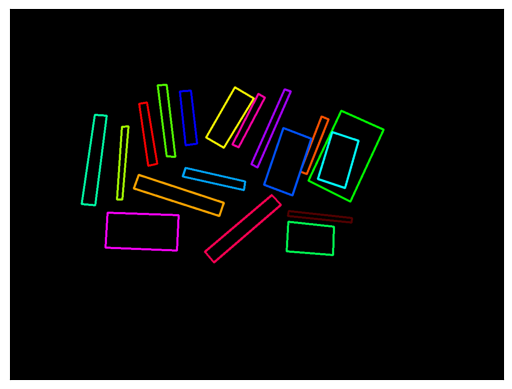

In [33]:
final_candidates, final_votes = determine_final_candidate(final_class_to_candidate, candidates, votes)
print('ojoierjoireoij')
print(final_votes)
polygons = []
inst_map = np.zeros([map_height, map_width, 3], dtype = "uint8")

for i in range(len(final_candidates)):
    try:
        candidate = final_candidates[i]
    #     vote = final_class_to_candidate.index([i])
    #     print('vote')
    #     print(vote)
        map_candidate = mapping(candidate)
    #     print(map_candidate)
        map_c = np.array(map_candidate['coordinates'])
        polygon = map_c[0][0:4]
    #     print(polygon)
        int_polygon = np.array(polygon, int)
        polygon =  np.reshape(int_polygon, [1,4,2])
        new_polygon = []
        for n in range(4):
            new_polygon.append([polygon[0,n,1], polygon[0,n,0]])
    #     print(new_polygon)
        polygon =  np.reshape(new_polygon, [1,4,2])
        new_polygon = np.array([polygon[:, 1, :], polygon[:, 2, :], polygon[:, 3, :], polygon[:, 0, :]])
        new_polygon =  np.reshape(new_polygon, [1,4,2])
        inst_map = cv2.polylines(inst_map, new_polygon, True, colors[i], thickness=3)
    except:
        continue

plt.tick_params(left = False, right = False , labelleft = False ,
            labelbottom = False, bottom = False)
plt.imshow(inst_map)
plt.savefig('final_mapA3.png', bbox_inches='tight') 

plt.show()    


In [1813]:
# print(final_candidates)
# print(final_votes)

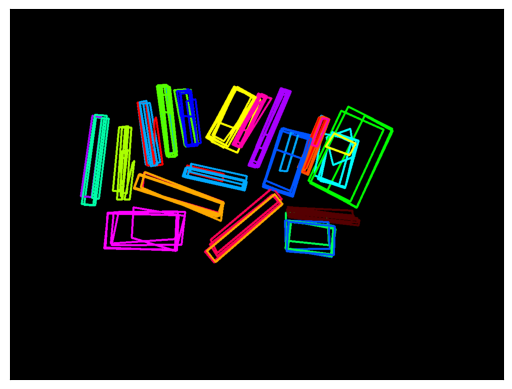

In [35]:
%matplotlib inline
inst_map = np.zeros([map_height, map_width, 3], dtype = "uint8")
# print(ids_list[0:20])
# for i in range(len(points_maps)):
for i in range(0,9):
    inst_map = draw_map_all(points_maps[i], fov_maps[i], ids_list[i], colors, map_height, map_width, inst_map)
  

plt.tick_params(left = False, right = False , labelleft = False ,
            labelbottom = False, bottom = False)

plt.imshow(inst_map)
# plt.savefig('multi_map.png', bbox_inches='tight') 

In [1815]:
# %matplotlib inline
# # print(points_maps[0])
# i = 0
# for i in range(20):
#     print(i)
#     final_map = draw_map(points_maps_gt[i], fov_maps_gt_draw[i], ids_list_gt[i], colors, map_height, map_width, draw_fov = True)


In [1816]:
indp = 24

In [1970]:
# for o in range(21):
# print(final_candidates)

o = indp
print(o)
count_zeros = 0
for t in range(18):
#     print(t)
    try:
        if t == 0:
            IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][4])
        elif t == 4:
            IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][0])
        else:
            IoU = Intersection_over_Union(final_candidates[t], points_polygons_gt[o][t])
        if IoU == 0.0:
            count_zeros += 1
        print(IoU)
    except:
        IoU = 0
        print(IoU)
        count_zeros += 1
        continue
# print(IoU)
#     print(np.sum(IoU))
#     if np.sum(IoU) > 10:
#         print(o)
#         print(100*IoU)
#         indp = o
indp += 1

print('count_zeros: ', count_zeros)

24
0.8865381073461637
0.9262064553715234
0.7973433328674794
0.8104898768978972
0.5933895285088583
0.6129856787992223
0.7158290125133003
0.5093946284629421
0.0
0.0
0.8486375273230343
0.7523601321271074
0.9564761509474303
0.9106123743216056
0.8919505510927902
0.8865329475018585
0.9395462353249153
0.7902179689340962
count_zeros:  2


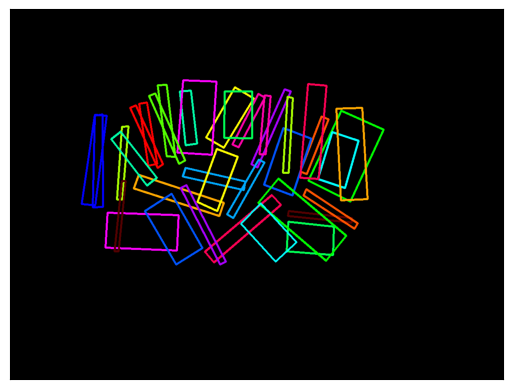

In [34]:
inst_map = np.zeros([map_height, map_width, 3], dtype = "uint8")


for i in range(len(final_candidates)):
    
    if i == 0:
        candidate = final_candidates[4]
    elif i == 4:
        candidate = final_candidates[0]
    else:
        candidate = final_candidates[i]
#     print('candidate')
#     print(candidate)
#     print(np.shape(candidate))
#     vote = final_class_to_candidate.index([i])
#     print('vote')
#     print(vote)
    if candidate != []:
        map_candidate = mapping(candidate)
    #     print(map_candidate)
        map_c = np.array(map_candidate['coordinates'])
        polygon = map_c[0][0:4]
    #     print(polygon)
        int_polygon = np.array(polygon, int)
        polygon =  np.reshape(int_polygon, [1,4,2])
        new_polygon = []
        for n in range(4):
            new_polygon.append([polygon[0,n,1], polygon[0,n,0]])
    #     print(new_polygon)
        polygon =  np.reshape(new_polygon, [1,4,2])
        new_polygon = np.array([polygon[:, 1, :], polygon[:, 2, :], polygon[:, 3, :], polygon[:, 0, :]])
        new_polygon =  np.reshape(new_polygon, [1,4,2])
        inst_map = cv2.polylines(inst_map, new_polygon, True, colors[i], thickness=3)
    # print('--------------------------')




for i in range(len(final_candidates)):
    candidate = points_maps_gt[indp-1][i]
#     print('candidate'
#     print(candidate)
#     print(np.shape(candidate))

    int_polygon = np.array(candidate, int)
    polygon =  np.reshape(int_polygon, [1,4,2])
    new_polygon = []
    for n in range(4):
        new_polygon.append([polygon[0,n,1], polygon[0,n,0]])
#     print(new_polygon)
    polygon =  np.reshape(new_polygon, [1,4,2])
    new_polygon = np.array([polygon[:, 1, :], polygon[:, 2, :], polygon[:, 3, :], polygon[:, 0, :]])
    new_polygon =  np.reshape(new_polygon, [1,4,2])
    inst_map = cv2.polylines(inst_map, new_polygon, True, colors[i], thickness=3)


plt.tick_params(left = False, right = False , labelleft = False ,
            labelbottom = False, bottom = False)

plt.imshow(inst_map)
# plt.savefig('overlapping_map1.png', bbox_inches='tight') 


# RESULTS ARE BELOW

I have to solve conflicts: The same candidate can be selected for several classes, which is not allowed.

Idea: if several candidates are equally valid, append all of them and then solve the conflicts in another loop

# To continue the work:

Right now, the logic seems to be solvable. Two main tasks need to be addressed:

1) The votes need to be solved in such a way that a list with the final predicted classes out of the list "votes" is obtained.

2) A single polygon must be predicted out of each entry of the "candidates" list. 

With those two tasks solved, a predicted map can me obtained and compared with a ground-truth map.

# Current state:
I now I have an easy way to keep track of the polygons and calculate their intersection over union. I now need to build the logic for the voting system.
1) for the first view, create canditates of all the polygons (two lists, polygons and ids)
2) in the following views, match polygons of previous view to current using iou as long as previows iou is in field of view
3) if match, add a vote to candidate, if not, add a vote to backgorund
4) unmatched polygons are considered new candidates

# A3

In [53]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.5
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[6], [3], [9], [14], [17], [1], [7], [18], [16], [11], [5], [4], [10], [12], [15], [13], [0], [2]]
[[17, 17], [6, 6], [18, 18, 18], [2, 2], [12, 12, 12], [11, 11], [1], [7, 7, 7], [8], [3, 3, 3], [13, 13, 13], [10], [14, 14, 14], [16, 16], [10, 9, 4, 4], [15, 15], [9, 9, 9], [5, 5], [8, 8]]
_____________________________________
views:  4
[[6], [3], [9], [14], [17], [1], [7], [18], [16], [11], [5], [4], [10], [12], [15], [13], [0], [2]]
[[17, 17, 17], [6, 6], [18, 18, 18], [2, 2, 2], [12, 12, 12], [11, 11], [1], [7, 7, 7], [8], [3, 3, 3], [13, 13, 13], [10], [14, 14, 14], [16, 16, 16], [10, 9, 4, 4], [15, 15], [9, 9, 9], [5, 5], [8, 8]]
_____________________________________
views:  5
[[6], [3], [9], [14], [17], [1], [7], [18], [16], [11], [5], [4], [10], [12], [15], [13], [0], [2]]
[[17, 17, 17, 17], [6, 6, 6], [18, 18, 18, 18], [2, 2, 2, 2], [12, 12, 12, 12], [11, 11, 4], [1, 1], [7, 7, 7, 7], [8], [3, 3, 3, 3], [13, 13, 13, 13], [10, 10], [14, 14, 14, 14], [16, 16, 16, 16],

# A4 

I think it's better to leave this arrangement out since instrument 03 can't be detected due to the aligment 

In [40]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.1
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

C:\Users\joreb\anaconda3\envs\instrument\lib\site-packages\shapely\set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


views:  3
[[7], [8], [2], [], [15], [5], [10], [], [], [9], [14], [4], [13], [6], [], [3], [1, 11], [0]]
[[18, 18], [17, 17], [3, 3, 12], [16, 16, 16], [12, 12], [6, 6, 6], [14, 14], [1, 1, 1], [2, 2, 2], [10, 10, 10], [7, 7], [17, 17], [10, 10], [12, 12, 13, 13], [10, 11, 11, 11], [1, 10, 5], [1]]
_____________________________________
views:  4
[[7], [8], [2], [], [15], [5], [10], [], [12], [9], [14], [4], [13], [6], [], [3], [1, 11], [0]]
[[18, 18], [17, 17], [3, 3, 12], [16, 16, 16, 16], [12, 12, 12], [6, 6, 6], [14, 14], [1, 1, 1], [2, 2, 2], [10, 10, 10, 10], [7, 7], [17, 17], [10, 10, 9], [12, 12, 13, 13, 13, 12], [10, 11, 11, 11, 11], [1, 10, 5], [1], [10]]
_____________________________________
views:  5
[[7], [8], [2], [], [15], [5], [10], [], [12], [9], [14], [4], [13], [6], [], [3], [1, 11], [0]]
[[18, 18, 18], [17, 17], [3, 3, 12], [16, 16, 16, 16], [12, 12, 12, 12], [6, 6, 6], [14, 14, 14], [1, 1, 1, 3], [2, 2, 2], [10, 10, 10, 10], [7, 7, 7], [17, 17], [10, 10, 9, 10], [12

ValueError: list.remove(x): x not in list

# A5

I have a problem here with class 10, but I think I can solve it using logic regarding the similar-looking instruments

In [443]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.1
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[7], [2], [8], [14], [5], [9], [10], [15], [], [17], [13], [4], [11], [12], [0], [6], [3], [1]]
[[15], [18, 18], [2], [17, 17], [12], [5, 1], [16, 16, 16], [1, 1], [3, 3], [6, 6], [7, 7], [13, 13, 12], [14], [11, 11], [4, 4], [8], [11, 1], [10, 10]]
_____________________________________
views:  4
[[7], [2], [8], [14], [5], [9], [10], [15], [], [17], [13], [4], [11], [12], [0], [6], [3], [1]]
[[15, 15], [18, 18], [2, 2], [17, 17, 17], [12, 12], [5, 1], [16, 16, 16], [1, 1], [3, 3, 3], [6, 6], [7, 7], [13, 13, 12, 12], [14, 14], [11, 11], [4, 4, 4], [8], [11, 1], [10, 10]]
_____________________________________
views:  5
[[7], [2], [8], [14], [5], [9], [10], [15], [], [17], [13], [4], [11], [12], [0], [6], [3], [1]]
[[15, 15, 15], [18, 18, 18], [2, 2, 2], [17, 17, 17, 17], [12, 12, 12], [5, 1, 10], [16, 16, 16, 16], [1, 1], [3, 3, 3, 3], [6, 6], [7, 7], [13, 13, 12, 12, 13], [14, 14, 14], [11, 11, 11], [4, 4, 4, 4], [8], [11, 1], [10, 10, 10]]
__________________________________

In [441]:
print(votes[21])

[8, 8, 8, 8, 8, 8]


# A6

In [429]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.3
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[12, 20], [4], [3], [16], [5], [11, 19], [2], [7], [15], [8], [13], [9], [6], [10], [17], [14], [0], [1]]
[[17, 17, 17], [18, 18], [7, 7, 7], [3, 3, 3], [2, 2, 2], [5], [13, 13], [8, 8], [10, 10], [12, 12], [14, 14, 14], [6], [1], [11, 11, 11], [17, 17, 16, 14], [10, 9, 9], [3, 10, 4, 4], [15, 15, 15], [8], [8, 6], [1]]
_____________________________________
views:  4
[[12, 20, 21], [4], [3], [16], [5], [11, 19, 22], [2], [7], [15], [8], [13], [9], [6], [10], [17], [14], [0], [1]]
[[17, 17, 17, 17], [18, 18, 18], [7, 7, 7, 7], [3, 3, 3, 3], [2, 2, 2, 2], [5], [13, 13], [8, 8, 8], [10, 10, 10], [12, 12, 13], [14, 14, 14, 14], [6], [1], [11, 11, 11, 11], [17, 17, 16, 14, 16], [10, 9, 9, 9, 14], [3, 10, 4, 4, 9], [15, 15, 15, 15], [8], [8, 6], [1], [1], [6]]
_____________________________________
views:  5
[[20], [4], [3], [16], [5], [11, 19, 22], [2], [7], [15], [8], [13], [9], [6], [10], [17], [14], [0], [1]]
[[17, 17, 17, 17], [18, 18, 18], [7, 7, 7, 7], [3, 3, 3, 3, 3], [2, 2

# A7

I have a problem here with class 10, but I think I can solve it using logic regarding the similar-looking instruments

In [415]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.5
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[15, 21], [9], [18], [2, 16, 19, 27], [11], [1], [0], [7, 20, 22], [25], [10, 17], [], [3], [6], [4], [14], [5], [12], [13]]
[[7, 7], [6], [4], [12, 12], [14, 14, 14], [16, 16], [13, 13], [8], [3], [2, 2, 2], [10, 10, 10], [5, 5], [17, 17, 17], [17, 18], [15, 15, 15], [1], [4], [10, 10, 10], [3, 3], [4], [8], [1], [8], [12], [7], [9], [5], [4, 10]]
_____________________________________
views:  4
[[21], [9], [18], [19], [11], [1], [0], [20], [17, 25], [10], [], [3], [6], [4], [14], [5], [12], [13]]
[[7, 7, 7], [6], [4], [12, 12, 12], [14, 14, 14, 14], [16, 16], [13, 13], [8], [3], [2, 2, 2, 2], [10, 10, 10, 10], [5, 5], [17, 17, 17, 17], [17, 18, 18], [15, 15, 15, 15], [1], [4], [10, 10, 10, 9], [3, 3], [4, 4], [8, 8], [1, 1], [8], [12], [7], [9], [5], [4, 10]]
_____________________________________
views:  5
[[21], [9], [18], [19], [11], [1], [0], [20], [25], [10], [], [3], [6], [4], [14], [5], [12], [13]]
[[7, 7, 7, 7], [6, 6], [4], [12, 12, 12], [14, 14, 14, 14], [16, 16], 

# A8

In [401]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.3
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[8], [1], [3], [2], [16], [4], [15, 18], [12], [7], [10, 17], [], [6, 9], [6, 9], [5], [11], [13], [14], [0]]
[[18, 18], [2, 2, 2, 18], [4, 4], [3, 3], [6, 6], [14], [12, 13], [10, 9], [1, 1], [12, 13], [10, 10], [15, 15], [8, 8], [16], [17, 15, 17], [7], [5], [10, 10], [7], [6], [17]]
_____________________________________
views:  4
[[8], [1], [3], [2], [16], [4], [15, 18, 21], [12], [7], [10], [17], [6], [9], [5], [11], [13], [14], [0]]
[[18, 18], [2, 2, 2, 18, 2], [4, 4, 4], [3, 3, 3], [6, 6, 6], [14], [12, 13, 12], [10, 9], [1, 1, 1], [12, 13], [10, 10], [15, 15, 15], [8, 8, 7, 8], [16, 16], [17, 15, 17, 17], [7], [5, 5], [10, 10, 11], [7], [6], [17], [7]]
_____________________________________
views:  5
[[8], [1], [3], [2], [16], [4], [18], [12], [7], [10], [17], [6], [9], [5], [11], [13], [14], [0]]
[[18, 18, 18], [2, 2, 2, 18, 2, 2], [4, 4, 4], [3, 3, 3], [6, 6, 6], [14, 14], [12, 13, 12, 12], [10, 9, 10], [1, 1, 1], [12, 13, 13], [10, 10, 10], [15, 15, 15], [8, 8, 7, 8

# A9

In [387]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.5
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[19], [9], [4], [], [], [8, 18], [11], [3], [16, 22], [10], [14], [1], [2], [7], [0], [6], [5], [15]]
[[15, 15], [12, 12, 12], [13, 13], [8, 8], [3, 3, 3], [17, 17, 17], [16, 16], [14, 14, 14], [6], [2, 2], [10, 10, 10], [7, 7, 7], [3, 10, 10], [1], [11, 11], [18, 18, 18], [9], [10], [6], [1, 1], [10], [16], [10, 9]]
_____________________________________
views:  4
[[19], [9], [4], [20], [12], [8, 18], [11], [3], [16, 22], [10], [14], [1], [2], [7], [0], [6], [5], [15]]
[[15, 15, 15], [12, 12, 12], [13, 13, 13], [8, 8], [3, 3, 3], [17, 17, 17], [16, 16], [14, 14, 14, 14], [6], [2, 2], [10, 10, 10, 10], [7, 7, 7], [3, 10, 10, 5], [1], [11, 11], [18, 18, 18], [9], [10], [6], [1, 1, 1], [10, 4], [16], [10, 9, 10], [17], [3], [16], [18]]
_____________________________________
views:  5
[[19], [9], [4], [20], [12], [8], [11], [3], [16, 22], [10], [14], [1], [2], [7], [0], [6], [5], [15]]
[[15, 15, 15], [12, 12, 12], [13, 13, 13], [8, 8, 8], [3, 3, 3], [17, 17, 17], [16, 16], [14, 1

# A10

In [354]:
classes = range(1,19)
for num_views in range(3, 15, 1):
    threshold = 0.5
    candidates, votes = candidate_and_vote_matching(points_polygons, ids_list, num_views, threshold)
    final_class_to_candidate = vote_counting(candidates, votes, classes)
    
    print('===============')
    print('views: ', num_views)
    print(final_class_to_candidate)
    print('===============')
    print(votes)
    print('_____________________________________')

views:  3
[[], [4], [6], [18], [], [2, 15], [1], [], [7], [10, 16], [13], [12, 17], [5], [3], [0], [9], [14], [8]]
[[15, 15, 15], [7], [6], [14, 14, 14], [2, 2, 2], [13, 13], [3], [9, 10], [18], [16], [10], [4, 3], [12, 13], [10, 11, 11], [17, 15, 15, 17], [6], [10], [12], [4]]
_____________________________________
views:  4
[[], [4], [6], [18], [20], [2, 15], [1], [], [7], [10, 16], [13], [12, 17], [5], [3], [0], [9], [14], [8]]
[[15, 15, 15, 15], [7], [6, 6], [14, 14, 14], [2, 2, 2, 2], [13, 13, 13], [3, 3], [9, 10, 9], [18, 18], [16, 16], [10], [4, 3], [12, 13], [10, 11, 11, 11], [17, 15, 15, 17, 17], [6, 6], [10], [12], [4, 4, 10], [6], [3, 5]]
_____________________________________
views:  5
[[], [4], [6], [18], [20], [2, 15], [1], [], [7], [10, 16], [13], [12, 17], [5], [3], [0], [9], [14], [8]]
[[15, 15, 15, 15], [7], [6, 6], [14, 14, 14], [2, 2, 2, 2], [13, 13, 13], [3, 3], [9, 10, 9], [18, 18], [16, 16], [10], [4, 3], [12, 13], [10, 11, 11, 11], [17, 15, 15, 17, 17], [6, 6], [1